# Imports

In [572]:
!source activate /home/gilbee3/anaconda3/envs/akita

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import operator as op
import seaborn as sns
sns.set(color_codes=True) # Seaborn desaturates matplotlib colors (this is useful if you use both seaborn and basic matplot lib and want colors to be consistent)
import scipy.stats as stats
sns.set(palette='husl', context = 'poster', style='white')
from os import path
import math
import sys, os, importlib

filename='/dors/capra_lab/users/erin/RotationProject_Akita/scripts/basenji/basenji'
sys.path.append(os.path.dirname(filename))

import json
import subprocess
os.environ["CUDA_VISIBLE_DEVICES"] = '-1' ### run on CPU

import tensorflow as tf
# print(tf.__version__)
# if tf.__version__[0] == '1':
#     tf.compat.v1.enable_eager_execution()

tf.compat.v1.enable_eager_execution()
import pysam
from cooltools.lib.numutils import set_diag

from basenji import dataset, dna_io, seqnn

In [574]:
### load params, specify model ###

model_dir = '../scripts/basenji/manuscripts/akita/'
params_file = model_dir+'params.json'
model_file  = model_dir+'model_best.h5'
with open(params_file) as params_open:
    params = json.load(params_open)
    params_model = params['model']
    params_train = params['train']

seqnn_model = seqnn.SeqNN(params_model)

### restore model ###
# note: run %%bash get_model.sh 
# if you have not already downloaded the model
seqnn_model.restore(model_file)
print('successfully loaded')

### names of targets ###
data_dir =   '../scripts/basenji/manuscripts/akita/data/'

hic_targets = pd.read_csv(data_dir+'/targets.txt',sep='\t')
hic_file_dict_num = dict(zip(hic_targets['index'].values, hic_targets['file'].values) )
hic_file_dict     = dict(zip(hic_targets['identifier'].values, hic_targets['file'].values) )
hic_num_to_name_dict = dict(zip(hic_targets['index'].values, hic_targets['identifier'].values) )

# read data parameters
data_stats_file = '%s/statistics.json' % data_dir
with open(data_stats_file) as data_stats_open:
    data_stats = json.load(data_stats_open)
seq_length = data_stats['seq_length']
target_length = data_stats['target_length']
hic_diags =  data_stats['diagonal_offset']
target_crop = data_stats['crop_bp'] // data_stats['pool_width']
target_length1 = data_stats['seq_length'] // data_stats['pool_width']

target_length1_cropped = target_length1 - 2*target_crop
print('flattened representation length:', target_length) 
print('symmetrix matrix size:', '('+str(target_length1_cropped)+','+str(target_length1_cropped)+')')


Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
sequence (InputLayer)           [(None, 1048576, 4)] 0                                            
__________________________________________________________________________________________________
stochastic_reverse_complement ( ((None, 1048576, 4), 0           sequence[0][0]                   
__________________________________________________________________________________________________
stochastic_shift (StochasticShi (None, 1048576, 4)   0           stochastic_reverse_complement[0][
__________________________________________________________________________________________________
re_lu (ReLU)                    (None, 1048576, 4)   0           stochastic_shift[0][0]           
____________________________________________________________________________________________

successfully loaded
flattened representation length: 99681
symmetrix matrix size: (448,448)


# Functions

In [272]:
def fst3D(b,w, avg):
    if avg:
        b = np.mean(b)
        w = np.mean(w)
        fst = (b-w)/b
        
    else:
        fst = (b-w)/b
        fst = fst.rename('fst')
    return fst

In [53]:
def find_extrema_afr(row):
    maxi = max(row.ESN_3DFst, row.MSL_3DFst, row.LWK_3DFst, row.GWD_3DFst)
    maxi_idx = row[['ESN_3DFst','MSL_3DFst', 'LWK_3DFst','GWD_3DFst']].astype('float').idxmax()
    mini = min(row.ESN_3DFst, row.MSL_3DFst, row.LWK_3DFst, row.GWD_3DFst)
    mini_idx = row[['ESN_3DFst','MSL_3DFst', 'LWK_3DFst','GWD_3DFst']].astype('float').idxmin()
    diff = abs(float(maxi)-float(mini))
    
    return float(diff)

def find_extrema_super(row):
    maxi = max(row.AFR_3DFst, row.EUR_3DFst, row.EAS_3DFst, row.SAS_3DFst, row.AMR_3DFst)
    maxi_idx = row[['AFR_3DFst','EUR_3DFst', 'EAS_3DFst','SAS_3DFst', 'AMR_3DFst']].astype('float').idxmax()
    mini = min(row.AFR_3DFst, row.EUR_3DFst, row.EAS_3DFst, row.SAS_3DFst, row.AMR_3DFst)
    mini_idx = row[['AFR_3DFst','EUR_3DFst', 'EAS_3DFst','SAS_3DFst', 'AMR_3DFst']].astype('float').idxmin()
    diff = abs(float(maxi)-float(mini))
    
    return float(diff)

In [114]:
def basic_fst_plot_afr(df):
    fig, ax = plt.subplots(figsize=[40,10])
    sns.lineplot(y=df.ESN_3DFst, 
                 x=df.windowStartPos, 
                label='ESN')
    sns.lineplot(y=df.LWK_3DFst,
                 x=df.windowStartPos, 
                label='LWK')
    sns.lineplot(y=df.MSL_3DFst,
                 x=df.windowStartPos, 
                label='MSL')
    sns.lineplot(y=df.GWD_3DFst,
                 x=df.windowStartPos, 
                label='GWD')
    ax.vlines(x=df[df.diffs>=1].windowStartPos, ymin=-1, ymax=1)
    #plt.legend(bbox_to_anchor=(1.2, 0.5))
    plt.title(df.iloc[1].chr)
    plt.ylabel('3DFst')
    
def plot_subpop_avgs(dicty, code, name, m):
    keys, values = list(dicty.keys()), list(dicty.values())
    #sorted_keys, sorted_vals = zip(*sorted(pop_spears.items(), key=op.itemgetter(1)))
    fig, ax = plt.subplots(figsize=[20,10])
    sns.stripplot(data=values, size=6, linewidth=.9, edgecolor="white")
    sns.boxplot(data=values, width=.18)
    ax.set(xlabel=str(name +"Sub-populations"), ylabel=("Average Pairwise %s within Population" % m))     

    # category labels
    plt.xticks(plt.xticks()[0], keys)
    y = [np.quantile(dicty[code], 0.2)]*5
    ax.hlines(y, xmin=-0.5, xmax=5.5, label='20%ile', color='teal')
    plt.text(x=5.6,y=np.quantile(dicty[code], 0.2), s=str(code + ' 20%ile'))
    plt.show()
    for pop in dicty:
        print(pop + ' avg: '+str(np.mean(dicty[pop])))
    print(code + ' 20%ile: ' + str(np.quantile(dicty[code], 0.2)))

In [359]:
def one_fill(pair,focal, focal_dict):
    if focal in focal_dict:
        focal_dict[focal].append(pair)
    else:
        focal_dict[focal] = [pair]
    return focal_dict

In [443]:
# Option 1
# def super_fill_one_sub(sup, sub_pairs):
#     dicty = {}
#     for pair in sup_pairs[sup]:
#         sub0 = pair[0].split('_')[1]
#         sub1 = pair[1].split('_')[1]
#         if sub0==sub1:
#             dicty = one_fill(pair, sub0, dicty)
#         else:
#             dicty = one_fill(pair, 'Cross', dicty)
#     sub_pairs[sup] = dicty
#     return sub_pairs

#Option 2
# def super_fill_one_sub(sup, sub_pairs, focal):
#     dicty = {}
#     for pair in sup_pairs[sup]:
#         sub0 = pair[0].split('_')[1]
#         sub1 = pair[1].split('_')[1]
#         if sub0==sub1:
#             dicty = one_fill(pair, sub0, dicty)
#         elif sub0 != focal and sub1 != focal:
#             dicty = one_fill(pair, 'Cross', dicty)
#     sub_pairs[sup] = dicty
#     return sub_pairs


#Option 3
# def super_fill_one_sub(sup, sub_pairs, focal):
#     dicty = {}
#     for pair in sup_pairs[sup]:
#         sub0 = pair[0].split('_')[1]
#         sub1 = pair[1].split('_')[1]
#         if sub0==sub1==focal:
#             dicty = one_fill(pair, sub0, dicty)
#         else:
#             dicty = one_fill(pair, 'Cross', dicty)
#     sub_pairs[sup] = dicty
#     return sub_pairs



def mses_fill_subs_for_one_super(sup, sub_mses):
    sub_mses[sup] = {}
    for subpop in sub_pairs[sup].keys():
        sub_mses[sup][subpop] = pd.DataFrame(index=idx)
        for pair in sub_pairs[sup][subpop]:
            sub_mses[sup][subpop][pair] = pairs[pair].mse
        sub_mses[sup][subpop]['msdiff'] = sub_mses[sup][subpop].mean(axis=1)
    return sub_mses

In [578]:
def find_inFileLoc(indiv, chrm):
    if (indiv == "vindija") | (indiv == "altai") | (indiv == "denisova") | (indiv == "chagyrskaya"):
        in_file_loc = '/gpfs51/dors2/capra_lab/users/rinkerd/projects/3DNeand/data/genomes/%s/%s%s_hg19_masked.fa' % (indiv,chrm,indiv)
    elif os.path.exists('/dors/capra_lab/users/erin/RotationProject_Akita/data/genomes/1KG/%s/%s_%s_hg19_full.fa' % (indiv,chrm,indiv.split("_")[3])):
        in_file_loc = '/dors/capra_lab/users/erin/RotationProject_Akita/data/genomes/1KG/%s/%s_%s_hg19_full.fa' % (indiv,chrm,indiv.split("_")[3])
    else:
        in_file_loc = '/gpfs51/dors2/capra_lab/users/rinkerd/projects/3DNeand/data/genomes/1KG.individuals/%s/%s_%s_hg19_full.fa' % (indiv,chrm,indiv.split("_")[3])
    return in_file_loc

def runAkitaPreds(seq):
    #if len(seq) != 2**20: raise ValueError('len(seq) != seq_length')
    seq_1hot = dna_io.dna_1hot(seq)
    test_pred_from_seq = seqnn_model.model.predict(np.expand_dims(seq_1hot,0))
    return test_pred_from_seq

class extractFastaRunAkita:
    def __init__(self, indiv, chrm, start_loc, end):

        #find fasta file locations
        in_file_loc_indiv = find_inFileLoc(indiv, chrm)
        indiv_fasta_open = pysam.Fastafile(in_file_loc_indiv)
        mask_fasta_open = pysam.Fastafile('/gpfs51/dors2/capra_lab/users/rinkerd/projects/3DNeand/data/genomes/masked_hg19_reference/%s_hg19_archaic.masked.fa' % chrm) #for the masked
        human19_fasta_open = pysam.Fastafile('/dors/capra_lab/data/dna/human/hg19/%s.fa' % chrm)

        #extract sequences
        indiv_seq = indiv_fasta_open.fetch(chrm, start_loc, end).upper()
        masked_seq = mask_fasta_open.fetch(chrm, start_loc, end).upper() #for the masked 
        human19_seq = human19_fasta_open.fetch(chrm, start_loc, end).upper()

        # important harmonization step! then run predictions on the harmonized sequence
        indiv_fillMissing_seq = "".join([r if m == "N" else r if s == "N" else s for r, m, s in zip(human19_seq, masked_seq, indiv_seq)])
        self.seq = indiv_fillMissing_seq
        indiv_pred  = runAkitaPreds(indiv_fillMissing_seq)
        indiv_pred_hff = indiv_pred[:,:,0][0] # save only hff
        self.pred = indiv_pred_hff
        #return(indiv_pred_hff)
def from_upper_triu(vector_repr, matrix_len, num_diags):
    z = np.zeros((matrix_len,matrix_len))
    triu_tup = np.triu_indices(matrix_len,num_diags)
    z[triu_tup] = vector_repr
    for i in range(-num_diags+1,num_diags):
        set_diag(z, np.nan, i)
    return z + z.T
def from_upper_triu_combo(vec1, vec2, matrix_len, num_diags):
    z = np.zeros((matrix_len,matrix_len))
    x = np.zeros((matrix_len,matrix_len))
    triu_tup = np.triu_indices(matrix_len,num_diags)
    z[triu_tup] = vec1
    x[triu_tup] = vec2
    for i in range(-num_diags+1,num_diags):
        set_diag(z, np.nan, i)
        set_diag(x, np.nan, i)
    return z + x.T

In [755]:
def plot_pair_contact(pair, start, chrm):
    end = start + 2**20
    ind1 = pair[0]
    ind2 = pair[1]
    pred1 = extractFastaRunAkita(ind1,chrm,start, end).pred
    pred2 = extractFastaRunAkita(ind2,chrm,start, end).pred

    mat1 = from_upper_triu(pred1, target_length1_cropped, hic_diags)
    mat2 = from_upper_triu(pred2, target_length1_cropped, hic_diags)

    combo_mat = from_upper_triu_combo(pred1, pred2, target_length1_cropped, hic_diags)
    diff_mat = mat2-mat1
    name = chrm + ': ' + str(start) +'\n' +  ind1 

    plt.figure(figsize=(15,10))
    vmin=-2; vmax=2
    im = plt.matshow(combo_mat, fignum=False, cmap= 'RdBu_r', vmax=vmax, vmin=vmin)
    plt.colorbar(im, fraction=.04, pad = 0.05, ticks=[-2,-1, 0, 1,2]);
    plt.title(name,y=1.15 )
    plt.ylabel(ind2)

    plt.figure(figsize=(15,10))
    vmin=-.1; vmax=.1
    im = plt.matshow(diff_mat, fignum=False, cmap= 'PRGn', vmax=vmax, vmin=vmin)
    plt.colorbar(im, fraction=.04, pad = 0.05, ticks=[-.1,-.05, 0, .05,.1]);
    plt.title(name,y=1.15 )
    plt.ylabel(ind2)

# Reference structures

In [176]:
sas = ['SAS_BEB_female_HG03616',
    'SAS_BEB_female_HG03931',
    'SAS_BEB_female_HG03793',
    'SAS_GIH_female_NA21102',
    'SAS_BEB_female_HG03829',
    'SAS_BEB_female_HG03823',
    'SAS_GIH_female_NA20872',
    'SAS_GIH_female_NA20877',
    'SAS_GIH_female_NA20876',
    'SAS_GIH_female_NA21125',
    'SAS_ITU_female_HG03772',
    'SAS_ITU_female_HG03973',
    'SAS_ITU_female_HG03968',
    'SAS_ITU_female_HG03774',
    'SAS_ITU_female_HG03780',
    'SAS_PJL_female_HG02787',
    'SAS_PJL_female_HG03016',
    'SAS_PJL_female_HG02697',
    'SAS_PJL_female_HG03634',
    'SAS_PJL_female_HG02731',
    'SAS_STU_female_HG03643',
    'SAS_STU_female_HG03673',
    'SAS_STU_female_HG03849',
    'SAS_STU_female_HG04042',
    'SAS_STU_female_HG04099']
sas_pops = {'BEB': ['SAS_BEB_female_HG03616',
                'SAS_BEB_female_HG03931',
                'SAS_BEB_female_HG03793',
                'SAS_BEB_female_HG03829',
                'SAS_BEB_female_HG03823'], 
           'GIH':['SAS_GIH_female_NA21102',
                'SAS_GIH_female_NA20872',
                'SAS_GIH_female_NA20877',
                'SAS_GIH_female_NA20876',
                'SAS_GIH_female_NA21125'], 
           'ITU':['SAS_ITU_female_HG03772',
                'SAS_ITU_female_HG03973',
                'SAS_ITU_female_HG03968',
                'SAS_ITU_female_HG03774',
                'SAS_ITU_female_HG03780'],
          'PJL': ['SAS_PJL_female_HG02787',
                'SAS_PJL_female_HG03016',
                'SAS_PJL_female_HG02697',
                'SAS_PJL_female_HG03634',
                'SAS_PJL_female_HG02731'],
          'STU' : ['SAS_STU_female_HG03643',
                'SAS_STU_female_HG03673',
                'SAS_STU_female_HG03849',
                'SAS_STU_female_HG04042',
                'SAS_STU_female_HG04099']}
sas_pairs = [(a, b) for idx, a in enumerate(sas) for b in sas[idx + 1:]]


eur = ['EUR_CEU_female_NA12006',
    'EUR_FIN_female_HG00285',
    'EUR_GBR_female_HG00261',
    'EUR_IBS_female_HG01519',
    'EUR_TSI_female_NA20795',
    'EUR_IBS_female_HG01773',
    'EUR_IBS_female_HG01516',
    'EUR_IBS_female_HG01632',
    'EUR_IBS_female_HG01668',
    'EUR_CEU_female_NA12717',
    'EUR_CEU_female_NA12815',
    'EUR_CEU_female_NA12156',
    'EUR_CEU_female_NA12749',
    'EUR_FIN_female_HG00288',
    'EUR_FIN_female_HG00323',
    'EUR_FIN_female_HG00304',
    'EUR_FIN_female_HG00344',
    'EUR_TSI_female_NA20821',
    'EUR_GBR_female_HG00231',
    'EUR_TSI_female_NA20508',
    'EUR_TSI_female_NA20797',
    'EUR_TSI_female_NA20771',
    'EUR_GBR_female_HG00106',
    'EUR_GBR_female_HG00122',
    'EUR_GBR_female_HG00099']
eur_pops = {'CEU':['EUR_CEU_female_NA12006',
                'EUR_CEU_female_NA12717',
                'EUR_CEU_female_NA12815',
                'EUR_CEU_female_NA12156',
                'EUR_CEU_female_NA12749'],
            'FIN':['EUR_FIN_female_HG00285',
                'EUR_FIN_female_HG00288',
                'EUR_FIN_female_HG00323',
                'EUR_FIN_female_HG00304',
                'EUR_FIN_female_HG00344'],
           'GBR':['EUR_GBR_female_HG00261',
                'EUR_GBR_female_HG00231',
                'EUR_GBR_female_HG00106',
                'EUR_GBR_female_HG00122',
                'EUR_GBR_female_HG00099'],
           'IBS':['EUR_IBS_female_HG01519',
                'EUR_IBS_female_HG01773',
                'EUR_IBS_female_HG01516',
                'EUR_IBS_female_HG01632',
                'EUR_IBS_female_HG01668'],
           'TSI':['EUR_TSI_female_NA20795',
                'EUR_TSI_female_NA20821',
                'EUR_TSI_female_NA20508',
                'EUR_TSI_female_NA20797',
                'EUR_TSI_female_NA20771']}
eur_pairs = [(a, b) for idx, a in enumerate(eur) for b in eur[idx + 1:]]



eas = ['EAS_CHB_female_NA18625',
    'EAS_CHB_female_NA18626',
    'EAS_CDX_female_HG00978',
    'EAS_CHB_female_NA18595',
    'EAS_CHS_female_HG00560',
    'EAS_KHV_female_HG01851',
    'EAS_KHV_female_HG02016',
    'EAS_KHV_female_HG02075',
    'EAS_KHV_female_HG02069',
    'EAS_JPT_female_NA18951',
    'EAS_KHV_female_HG02057',
    'EAS_KHV_female_HG02127',
    'EAS_CDX_female_HG02181',
    'EAS_JPT_female_NA18975',
    'EAS_JPT_female_NA18999',
    'EAS_JPT_female_NA18978',
    'EAS_JPT_female_NA19001',
    'EAS_CDX_female_HG02185',
    'EAS_CDX_female_HG01817',
    'EAS_CDX_female_HG00879',
    'EAS_CDX_female_HG01808',
    'EAS_CHS_female_HG00608',
    'EAS_CHS_female_HG00611',
    'EAS_CHS_female_HG00705',
    'EAS_CHS_female_HG00437',
    'EAS_CHS_female_HG00446',
    'EAS_CHB_female_NA18572',
    'EAS_CHB_female_NA18559',
    'EAS_CHB_female_NA18747']
eas_pops = {'CDX':['EAS_CDX_female_HG00978',
                'EAS_CDX_female_HG02181',
                'EAS_CDX_female_HG02185',
                'EAS_CDX_female_HG01817',
                'EAS_CDX_female_HG00879',
                'EAS_CDX_female_HG01808'],
            'CHB':['EAS_CHB_female_NA18625',
                'EAS_CHB_female_NA18626',
                'EAS_CHB_female_NA18595',
                'EAS_CHB_female_NA18572',
                'EAS_CHB_female_NA18559',
                'EAS_CHB_female_NA18747'],
            'CHS':['EAS_CHS_female_HG00560',
                'EAS_CHS_female_HG00608',
                'EAS_CHS_female_HG00611',
                'EAS_CHS_female_HG00705',
                'EAS_CHS_female_HG00437',
                'EAS_CHS_female_HG00446'],
            'JPT':['EAS_JPT_female_NA18951',
                'EAS_JPT_female_NA18975',
                'EAS_JPT_female_NA18999',
                'EAS_JPT_female_NA18978',
                'EAS_JPT_female_NA19001'],
            'KHV':['EAS_KHV_female_HG01851',
                'EAS_KHV_female_HG02016',
                'EAS_KHV_female_HG02075',
                'EAS_KHV_female_HG02069',
                'EAS_KHV_female_HG02057',
                'EAS_KHV_female_HG02127']}
eas_pairs = [(a, b) for idx, a in enumerate(eas) for b in eas[idx + 1:]]

amr = ['AMR_PUR_female_HG00732',
    'AMR_CLM_female_HG01357',
    'AMR_CLM_female_HG01438',
    'AMR_CLM_female_HG01281',
    'AMR_CLM_female_HG01441',
    'AMR_PUR_female_HG01242',
    'AMR_CLM_female_HG01269',
    'AMR_MXL_female_NA19794',
    'AMR_PUR_female_HG01198',
    'AMR_PUR_female_HG01080',
    'AMR_PUR_female_HG01188',
    'AMR_PUR_female_HG01067',
    'AMR_PUR_female_HG00737',
    'AMR_MXL_female_NA19740',
    'AMR_MXL_female_NA19725',
    'AMR_MXL_female_NA19722',
    'AMR_MXL_female_NA19734',
    'AMR_PEL_female_HG02252',
    'AMR_PEL_female_HG01927',
    'AMR_PEL_female_HG01945',
    'AMR_PEL_female_HG01954',
    'AMR_PEL_female_HG01933']
amr_pops = {'CLM':['AMR_CLM_female_HG01357',
                'AMR_CLM_female_HG01438',
                'AMR_CLM_female_HG01281',
                'AMR_CLM_female_HG01441',
                'AMR_CLM_female_HG01269'],
            'MXL':['AMR_MXL_female_NA19794',
                'AMR_MXL_female_NA19740',
                'AMR_MXL_female_NA19725',
                'AMR_MXL_female_NA19722',
                'AMR_MXL_female_NA19734'],
            'PEL':['AMR_PEL_female_HG02252',
                'AMR_PEL_female_HG01927',
                'AMR_PEL_female_HG01945',
                'AMR_PEL_female_HG01954',
                'AMR_PEL_female_HG01933'],
            'PUR':['AMR_PUR_female_HG00732',
                'AMR_PUR_female_HG01242',
                'AMR_PUR_female_HG01198',
                'AMR_PUR_female_HG01080',
                'AMR_PUR_female_HG01188',
                'AMR_PUR_female_HG01067',
                'AMR_PUR_female_HG00737']}
amr_pairs = [(a, b) for idx, a in enumerate(amr) for b in amr[idx + 1:]]

afr = ['AFR_MSL_female_HG03086',
            'AFR_MSL_female_HG03378',
            'AFR_MSL_female_HG03437',
            'AFR_LWK_female_NA19378',
            'AFR_LWK_female_NA19445',
            'AFR_LWK_female_NA19434',
            'AFR_MSL_female_HG03212',
            'AFR_GWD_female_HG03040',
            'AFR_GWD_female_HG03028',
            'AFR_MSL_female_HG03085',
            'AFR_LWK_female_NA19017',
            'AFR_GWD_female_HG03539',
            'AFR_LWK_female_NA19019',
            'AFR_GWD_female_HG03046',
            'AFR_GWD_female_HG03025',
            'AFR_ESN_female_HG03105',
            'AFR_ESN_female_HG03511',
            'AFR_ESN_female_HG03514',
            'AFR_ESN_female_HG03499',
            'AFR_ESN_female_HG02922']
afr_pops = {'ESN': ['AFR_ESN_female_HG03105',
                    'AFR_ESN_female_HG03511',
                    'AFR_ESN_female_HG03514',
                    'AFR_ESN_female_HG03499',
                    'AFR_ESN_female_HG02922'], 
            'MSL' : ['AFR_MSL_female_HG03086',
                     'AFR_MSL_female_HG03378',
                     'AFR_MSL_female_HG03437',
                     'AFR_MSL_female_HG03212',
                     'AFR_MSL_female_HG03085'],
           'LWK': ['AFR_LWK_female_NA19378',
                'AFR_LWK_female_NA19445',
                'AFR_LWK_female_NA19434',
                   'AFR_LWK_female_NA19017',
                   'AFR_LWK_female_NA19019'], 
           'GWD' : ['AFR_GWD_female_HG03040',
                'AFR_GWD_female_HG03028',
                'AFR_GWD_female_HG03539',
                'AFR_GWD_female_HG03046',
                'AFR_GWD_female_HG03025']}
afr_pairs = [(a, b) for idx, a in enumerate(afr) for b in afr[idx + 1:]]

chrs = ['chr1',
        'chr2','chr3','chr4','chr5','chr6','chr7','chr8','chr9','chr10','chr11','chr12','chr13','chr14','chr15','chr16','chr17','chr18','chr19','chr20','chr21','chr22']

indivs = afr_20+amr+eas+eur+sas

super_pops = {'AFR':afr_20, 'AMR':amr,'EAS':eas,'EUR':eur, 'SAS':sas}

# Loading Files

In [17]:
coverage = pd.read_csv("/dors/capra_lab/users/erin/RotationProject_Akita/data/3dpreds/coveragePerIndiv/nonHarmonized/coverage_AFR_ESN_female_HG02922.txt.gz",sep="\t",header=None)
coverage.columns= ['chr','windowStartPos','coverage']
regionsToKeep = coverage[coverage['coverage'] == 1][['chr','windowStartPos']]

regions = pd.read_csv('/dors/capra_lab/users/erin/RotationProject_Akita/scripts/fromEvonne/genome_chunks_large.txt', header=None)
new = regions[0].str.split("\t", n = 1, expand = True)
new
regions['chr'] = new[0]
regions[0] = new[1]
regions_dict=[regions.set_index('chr').T.dropna().to_dict(orient='list') for k,v in regions.iterrows()][0]

In [231]:
pairs = {}
missing = []
for i1 in indivs:
    print(i1)
    for i2 in indivs:
        try:
            pair =  pd.read_csv("/dors/capra_lab/users/erin/RotationProject_Akita/data/3dpreds/allComps/3dcomp_%s_vs_%s.txt" % (i1,i2),sep="\t")
            try:
                coverage1 = pd.read_csv("/dors/capra_lab/users/erin/RotationProject_Akita/data/3dpreds/coveragePerIndiv/nonHarmonized/coverage_%s.txt.gz" % i1,sep="\t",header=None)
                coverage1.columns = ['chr','windowStartPos','%s_coverage'% i1]
                coverage2 = pd.read_csv("/dors/capra_lab/users/erin/RotationProject_Akita/data/3dpreds/coveragePerIndiv/nonHarmonized/coverage_%s.txt.gz" % i2,sep="\t",header=None)
                coverage2.columns = ['chr','windowStartPos','%s_coverage'% i2]
                pair = pair.merge(coverage1).merge(coverage2)
            except FileNotFoundError:
                pass
            pair = regionsToKeep.merge(pair, how='inner',on=['chr','windowStartPos']) # only keep windows with full coverage in 1kg
            pair = pair[pair.chr!='chrX']
            pair = pair.set_index(['chr','windowStartPos'])
            pairs[(i1,i2)] = pair
            
        except FileNotFoundError:
            if not path.exists("/dors/capra_lab/users/erin/RotationProject_Akita/data/3dpreds/allComps/3dcomp_%s_vs_%s.txt" % (i2,i1)):
                missing.append((i1,i2))
            pass

len(pairs)

AFR_MSL_female_HG03086
AFR_MSL_female_HG03378
AFR_MSL_female_HG03437
AFR_LWK_female_NA19378
AFR_LWK_female_NA19445
AFR_LWK_female_NA19434
AFR_MSL_female_HG03212
AFR_GWD_female_HG03040
AFR_GWD_female_HG03028
AFR_MSL_female_HG03085
AFR_LWK_female_NA19017
AFR_GWD_female_HG03539
AFR_LWK_female_NA19019
AFR_GWD_female_HG03046
AFR_GWD_female_HG03025
AFR_ESN_female_HG03105
AFR_ESN_female_HG03511
AFR_ESN_female_HG03514
AFR_ESN_female_HG03499
AFR_ESN_female_HG02922
AMR_PUR_female_HG00732
AMR_CLM_female_HG01357
AMR_CLM_female_HG01438
AMR_CLM_female_HG01281
AMR_CLM_female_HG01441
AMR_PUR_female_HG01242
AMR_CLM_female_HG01269
AMR_MXL_female_NA19794
AMR_PUR_female_HG01198
AMR_PUR_female_HG01080
AMR_PUR_female_HG01188
AMR_PUR_female_HG01067
AMR_PUR_female_HG00737
AMR_MXL_female_NA19740
AMR_MXL_female_NA19725
AMR_MXL_female_NA19722
AMR_MXL_female_NA19734
AMR_PEL_female_HG02252
AMR_PEL_female_HG01927
AMR_PEL_female_HG01945
AMR_PEL_female_HG01954
AMR_PEL_female_HG01933
EAS_CHB_female_NA18625
EAS_CHB_fem

7260

In [156]:
all_spearman= pd.read_csv('all_spearman.csv', index_col=0, header=0)
all_mse = pd.read_csv('all_mse.csv', index_col=0, header=0)


# Redoing strucutres

## AFR-nonAFR

### Calculating and chr22 average plots

In [496]:
# Index of the window by window data frame, pandas multi index (chr, pos) for all windows

idx = pairs[pair].index
sup_pairs = {}

for pair in pairs.keys():    
    sup0 = pair[0].split('_')[0]
    sup1 = pair[1].split('_')[0]
    if sup0==sup1=='AFR':
        sup_pairs = one_fill(pair, sup0, sup_pairs)
    elif (sup0 =='AFR' and sup1!='AFR') or (sup1 == 'AFR' and sup0 != 'AFR') :
        sup_pairs = one_fill(pair, 'nonAFR', sup_pairs)
    

#Grab the MSE info from all the pairwise comps and 
#calculate the mean MSDiff for each regionsaveraged on individuals
sup_mses = dict.fromkeys(sup_pairs)
  

for pop in sup_mses.keys():
    sup_mses[pop] = pd.DataFrame(index=idx)
    for pair in sup_pairs[pop]:
        sup_mses[pop][pair] = pairs[pair].mse
    sup_mses[pop]['msdiff'] = sup_mses[pop].mean(axis=1)

In [502]:
b = sup_mses['nonAFR'].msdiff
w = sup_mses['AFR'].msdiff
## fst = (b-w)/b
afr_fst = pd.DataFrame(fst3D(b,w, False))
afr_fst['between_msdiff'] = b
afr_fst['within_msdiff'] = w

In [714]:
pos_min = afr_fst.loc['chr22'].sort_values(by='fst').index[0]
pos_mid = 25690112
pos_max = afr_fst.loc['chr22'].sort_values(by='fst').index[-1]
pos_high = afr_fst.loc['chr22'].sort_values(by='fst').index[-3]

positions = [pos_min, pos_mid, pos_high, pos_max]

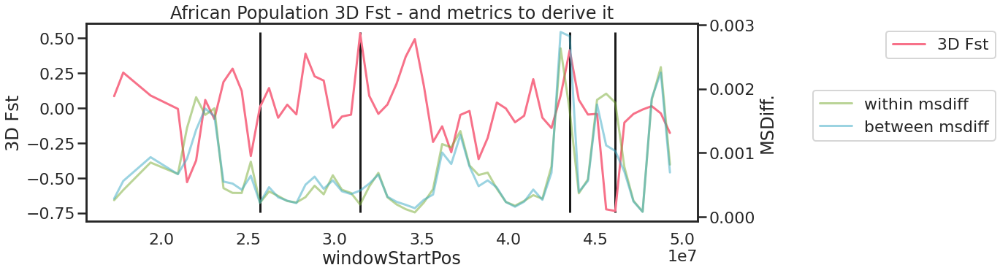

In [729]:
plt.figure(figsize=(15,5))
sns.lineplot(y = afr_fst.loc['chr22'].fst, x=afr_fst.loc['chr22'].index, color = sns.husl_palette(10)[0], label='3D Fst')
plt.legend(loc='upper right', bbox_to_anchor=(1, .5, .5, .5))
mi = afr_fst.loc['chr22'].fst.min()
ma = afr_fst.loc['chr22'].fst.max()
for p in positions:
    plt.vlines(x=p, ymin=mi-0.01, ymax=ma+0.01)

plt.ylabel('3D Fst')
ax2 = plt.twinx()
sns.lineplot(y = afr_fst.loc['chr22'].within_msdiff, x=afr_fst.loc['chr22'].index, ax=ax2, color=sns.husl_palette(10)[3], label='within msdiff', alpha=0.5)
sns.lineplot(y = afr_fst.loc['chr22'].between_msdiff, x=afr_fst.loc['chr22'].index, ax=ax2, color=sns.husl_palette(10)[6], label='between msdiff', alpha=0.5)
ax2.legend(loc='upper right', bbox_to_anchor=(1, .2, .5, .5))
plt.ylabel('MSDiff.')
plt.xlabel('Position on Chromosome 22')
plt.title('African Population 3D Fst - and metrics to derive it')
plt.show()

In [612]:
afr_fst

fst  between_msdiff  within_msdiff
chr   windowStartPos                                         
chr1  524288          0.284311        0.001240       0.000887
      1048576        -0.080013        0.002005       0.002165
      1572864        -0.115171        0.000942       0.001050
      4194304         0.076849        0.000475       0.000438
      4718592        -0.138187        0.000293       0.000334
...                        ...             ...            ...
chr22 47185920       -0.041748        0.000238       0.000248
      47710208       -0.010381        0.000077       0.000077
      48234496        0.013914        0.001851       0.001825
      48758784       -0.037868        0.002252       0.002338
      49283072       -0.177823        0.000691       0.000814

[4749 rows x 3 columns]

In [636]:
afr_fst.loc['chr22'].shape

(58, 3)

Text(0.5, 1.0, 'African 3D Fst')

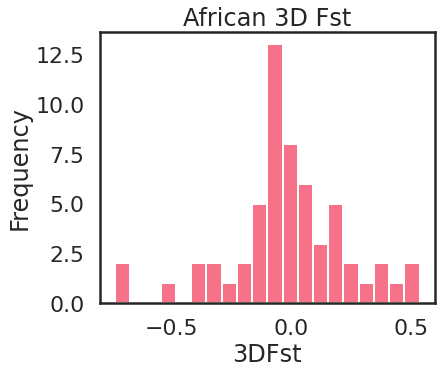

In [652]:
plt.figure(figsize=(6,5))
plt.hist(afr_fst.loc['chr22'].fst, bins=20)
plt.xlabel('3DFst')
plt.ylabel('Frequency')
plt.title('African 3D Fst')

Text(0.5, 1.0, 'MSDiff Within Africa')

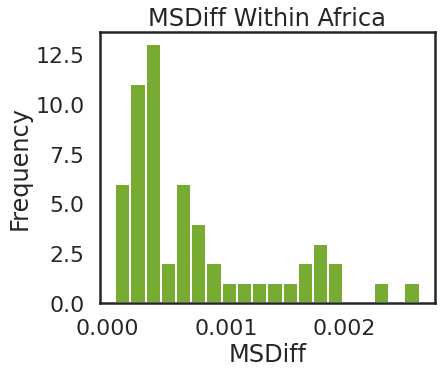

In [641]:
plt.figure(figsize=(6,5))
plt.hist(afr_fst.loc['chr22'].within_msdiff, color = sns.husl_palette(10)[3], bins=20)
plt.xlabel('MSDiff')
plt.ylabel('Frequency')
plt.title('MSDiff Within Africa')

Text(0.5, 1.0, 'MSDiff Between Africans and non-Africans')

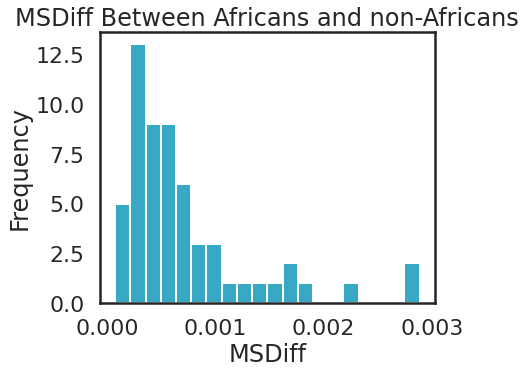

In [653]:
plt.figure(figsize=(6,5))
plt.hist(afr_fst.loc['chr22'].between_msdiff, color = sns.husl_palette(10)[6], bins=20)
plt.xlabel('MSDiff')
plt.ylabel('Frequency')
plt.title('MSDiff Between Africans and non-Africans')

### Interesting Regions distributions

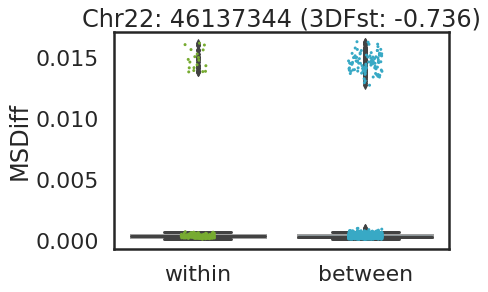

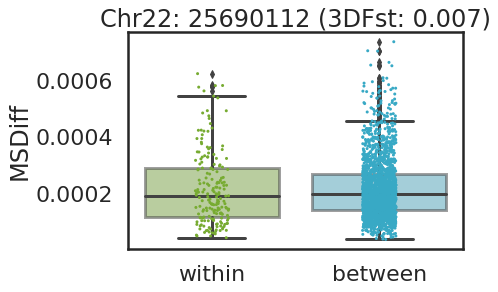

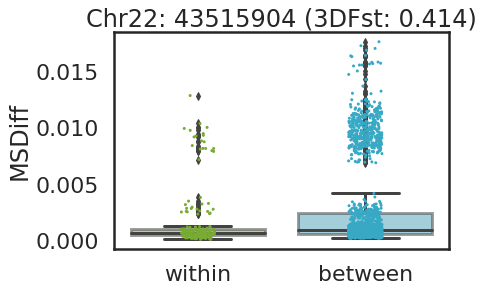

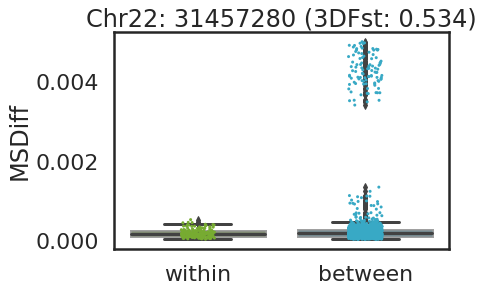

In [732]:
pal =[sns.husl_palette(10)[3],sns.husl_palette(10)[6]]
pos_dict = dict.fromkeys(positions)
for p in positions:
    pos_dict[p] = afr_fst.loc['chr22',p]
    f = afr_fst.loc['chr22',p].fst
    wpos =  sup_mses['AFR'].loc[chrm,p].rename('within')
    bpos = sup_mses['nonAFR'].loc[chrm,p].rename('between')
    df = pd.concat([wpos, bpos], axis=1).drop(index=['msdiff'])
    
    plt.title('Chr22: ' + str(p) + ' (3DFst: ' + str(round(f,3)) + ')')
    plt.ylabel('MSDiff')
    sns.boxplot(data=df,palette = pal,  boxprops=dict(alpha=.5))
    sns.stripplot(data=df,palette = pal, size=3)
    plt.show()

Text(0.5, 1.0, 'Within AFR')

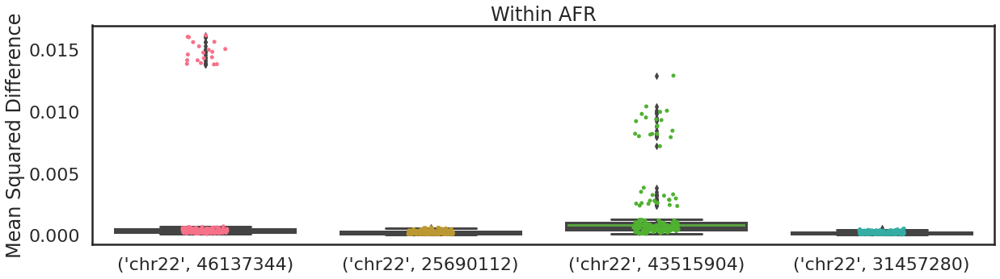

In [655]:
plt.figure(figsize=(20,5))
sns.boxplot(data=wmse_dists)
sns.stripplot(data=wmse_dists)
plt.ylabel('Mean Squared Difference')
plt.title('Within AFR')

Text(0.5, 1.0, 'Between AFR:nonAFR')

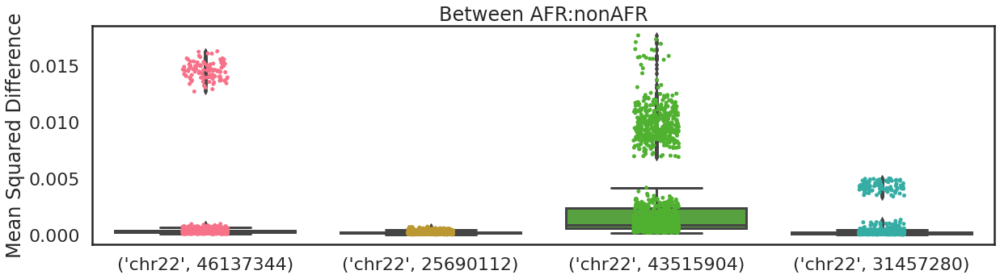

In [557]:
plt.figure(figsize=(20,5))
sns.boxplot(data=bmse_dists)
sns.stripplot(data=bmse_dists)
plt.ylabel('Mean Squared Difference')
plt.title('Between AFR:nonAFR')

### Interesting regions, contact maps

In [740]:
sup_mses['AFR'].loc[chrm,p].sort_values()[0]

(AFR_ESN_female_HG02922, AFR_MSL_female_HG03378)    0.000038
(AFR_GWD_female_HG03028, AFR_GWD_female_HG03046)    0.000046
(AFR_ESN_female_HG03105, AFR_MSL_female_HG03378)    0.000049
(AFR_ESN_female_HG02922, AFR_LWK_female_NA19434)    0.000055
(AFR_GWD_female_HG03025, AFR_GWD_female_HG03046)    0.000058
                                                      ...   
(AFR_GWD_female_HG03040, AFR_MSL_female_HG03086)    0.000416
(AFR_GWD_female_HG03040, AFR_MSL_female_HG03378)    0.000453
(AFR_ESN_female_HG03105, AFR_MSL_female_HG03212)    0.000458
(AFR_ESN_female_HG02922, AFR_GWD_female_HG03040)    0.000464
(AFR_ESN_female_HG03105, AFR_GWD_female_HG03040)    0.000532
Name: (chr22, 31457280), Length: 191, dtype: float64

In [733]:
pos_dict[positions[0]]

fst              -0.735872
between_msdiff    0.001027
within_msdiff     0.001783
Name: (chr22, 46137344), dtype: float64

#### Position 0 (minimum 3D Fst)

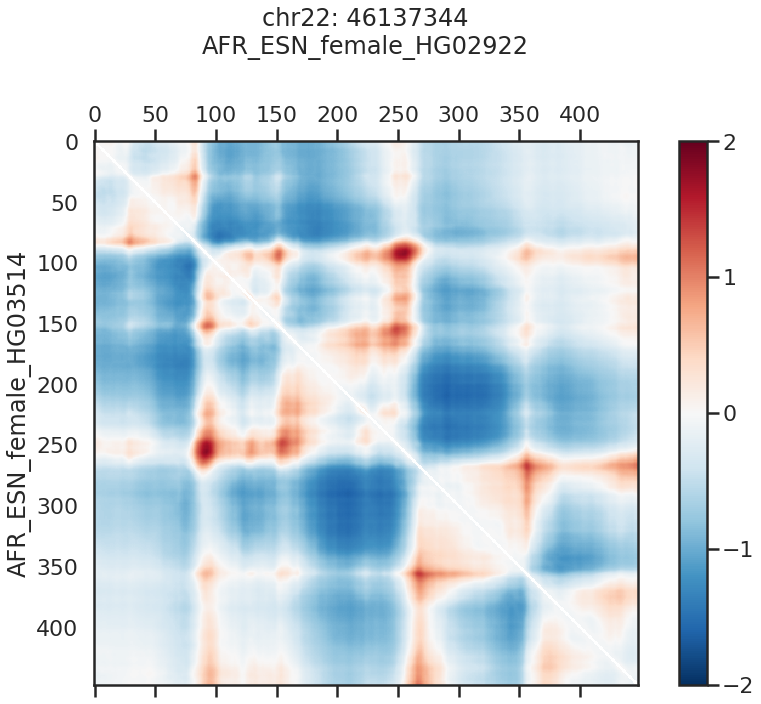

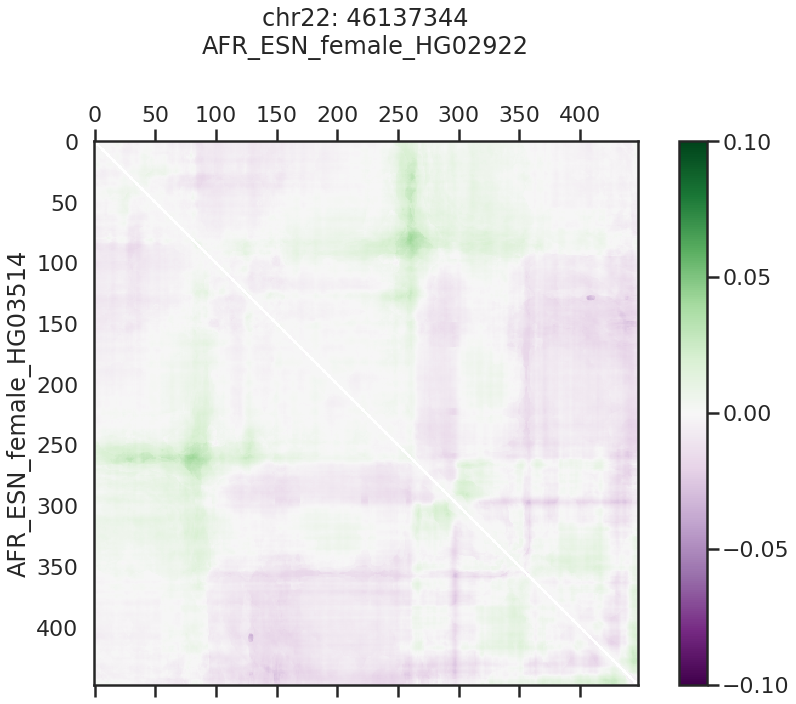

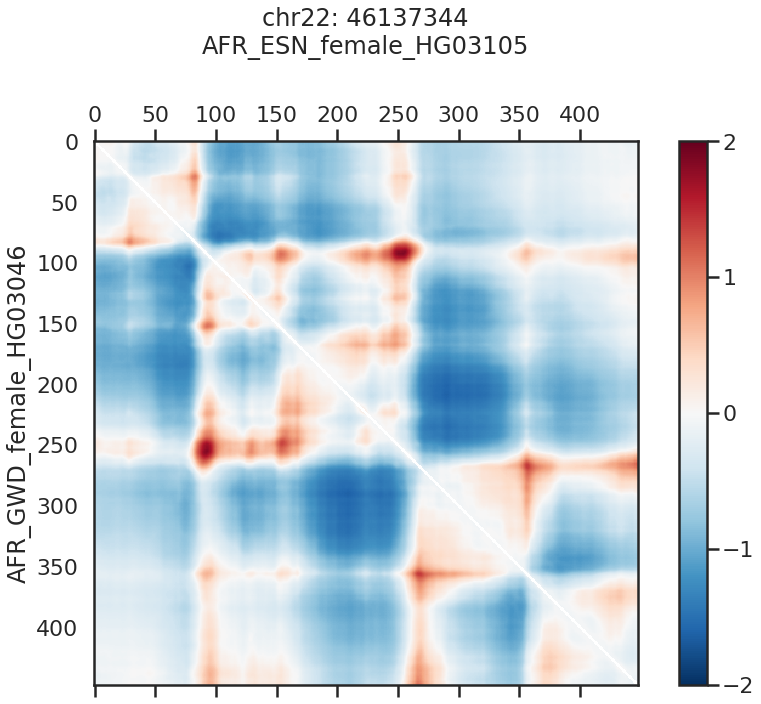

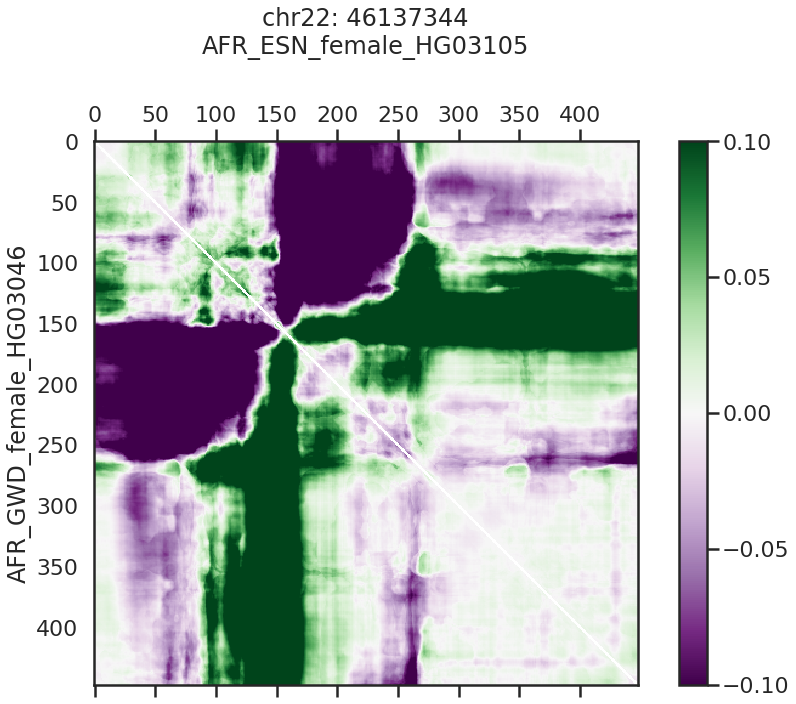

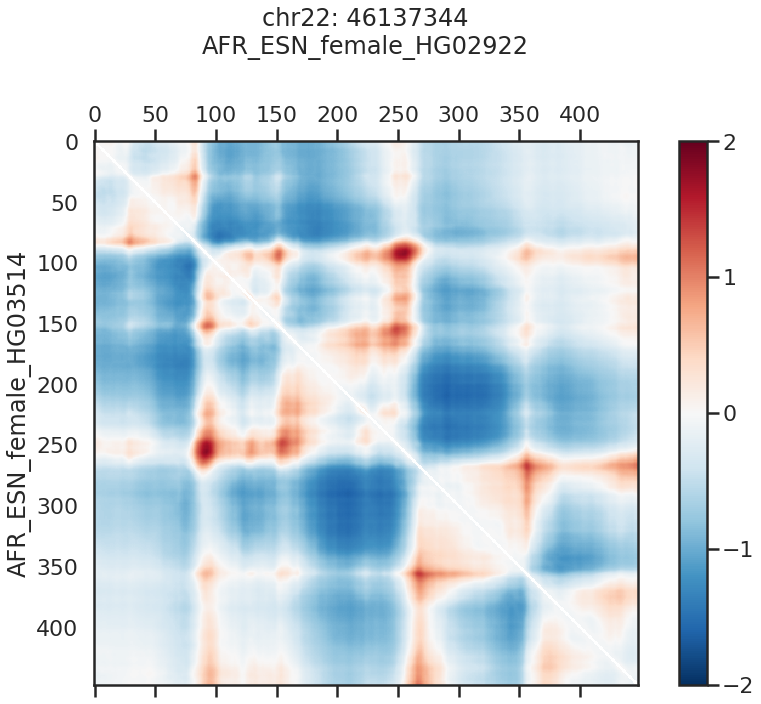

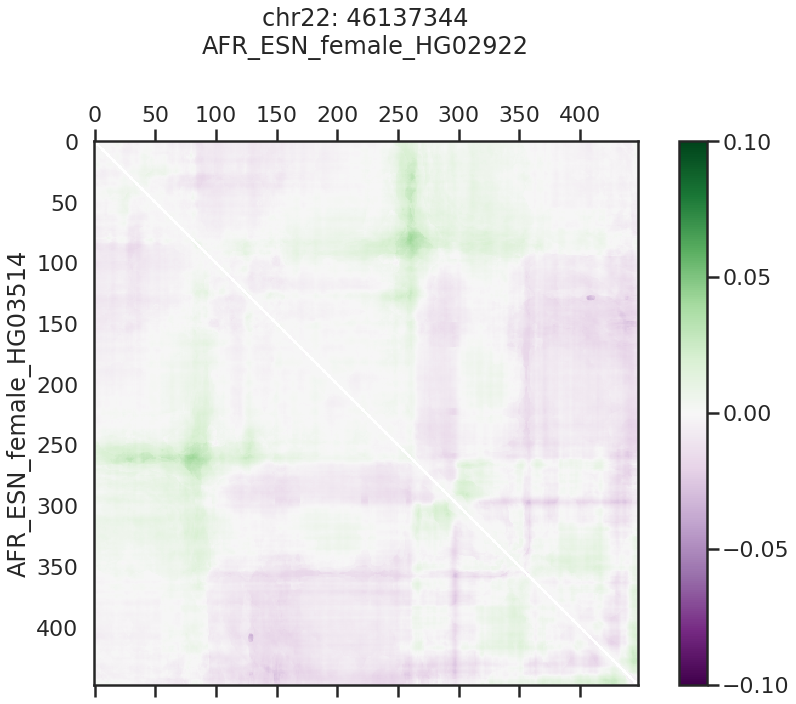

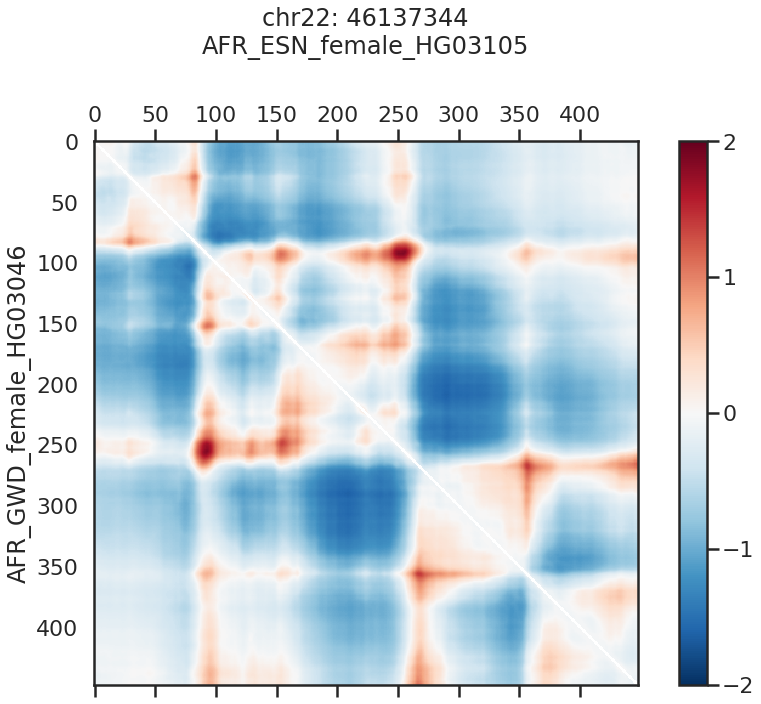

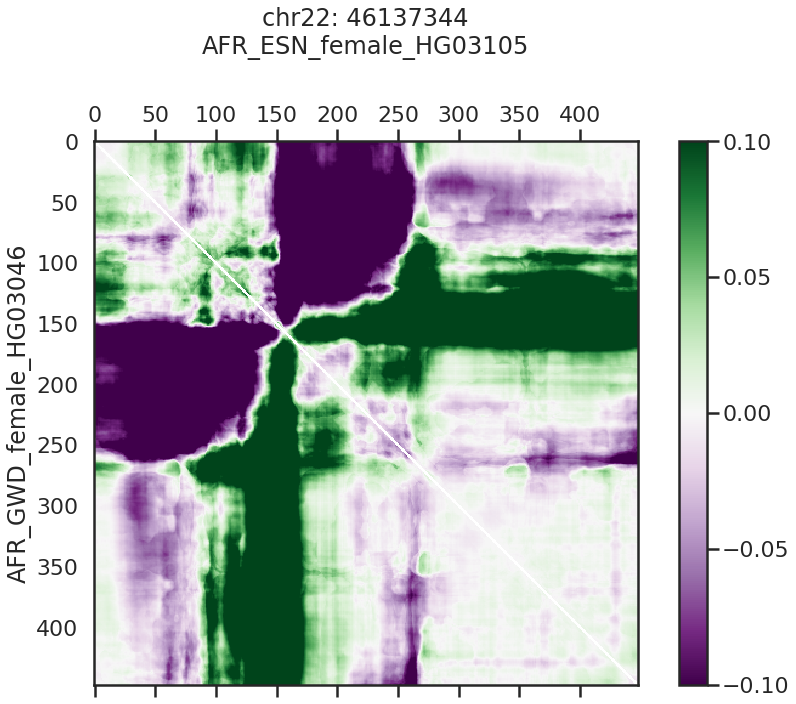

In [757]:
p = 0

min_within = sup_mses['AFR'].loc[chrm,positions[p]].sort_values().index[0]
max_within = sup_mses['AFR'].loc[chrm,positions[p]].sort_values().index[-1]

min_between = sup_mses['AFR'].loc[chrm,positions[p]].sort_values().index[0]
max_between = sup_mses['AFR'].loc[chrm,positions[p]].sort_values().index[-1]

plot_pair_contact(min_within, positions[p], chrm)
plot_pair_contact(max_within, positions[p], chrm)
plot_pair_contact(min_between, positions[p], chrm)
plot_pair_contact(max_between, positions[p], chrm)

#### Position 1 (3D Fst closest to 0)

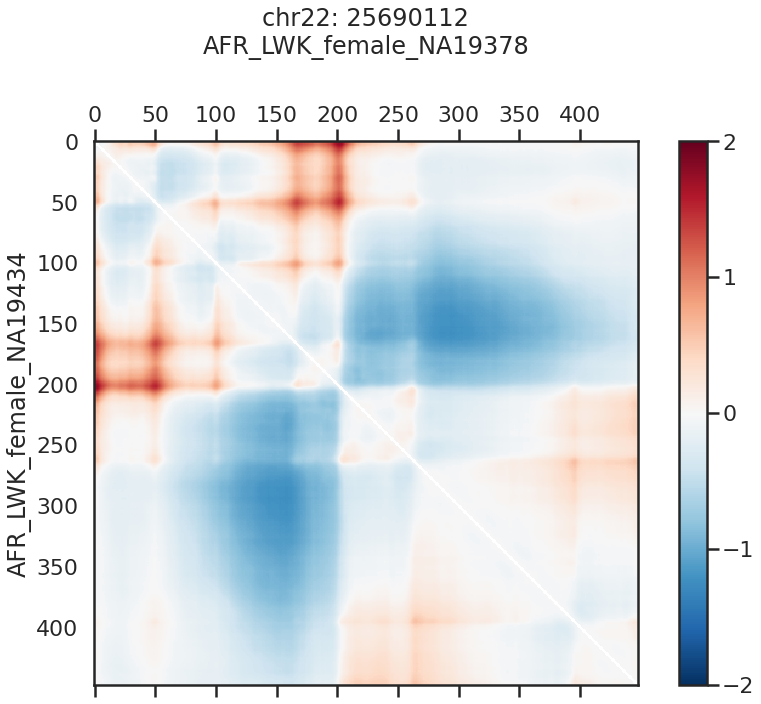

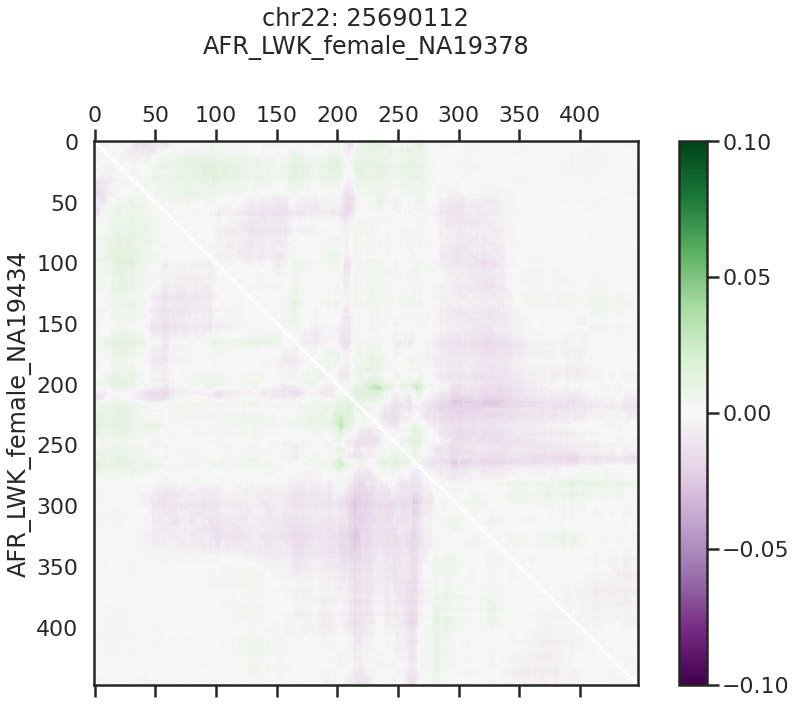

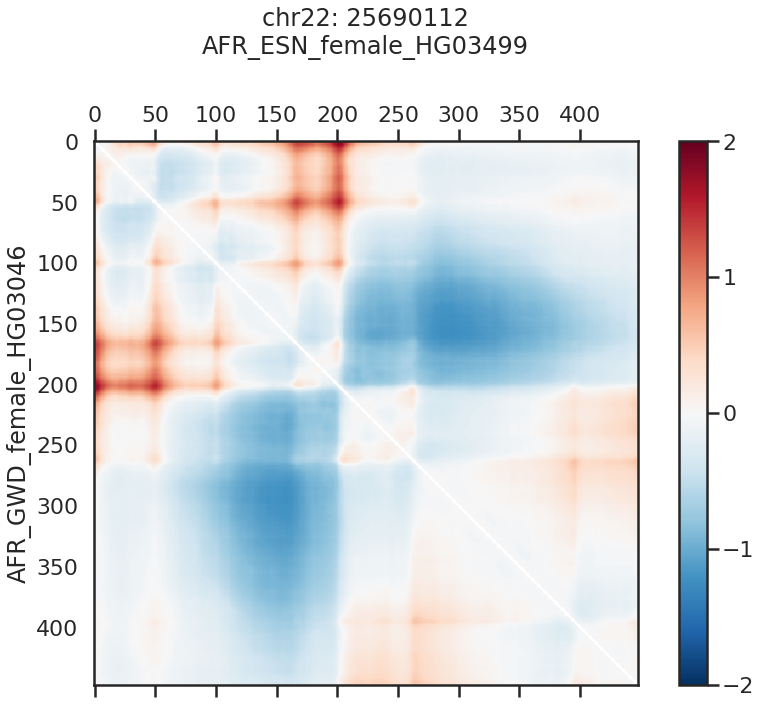

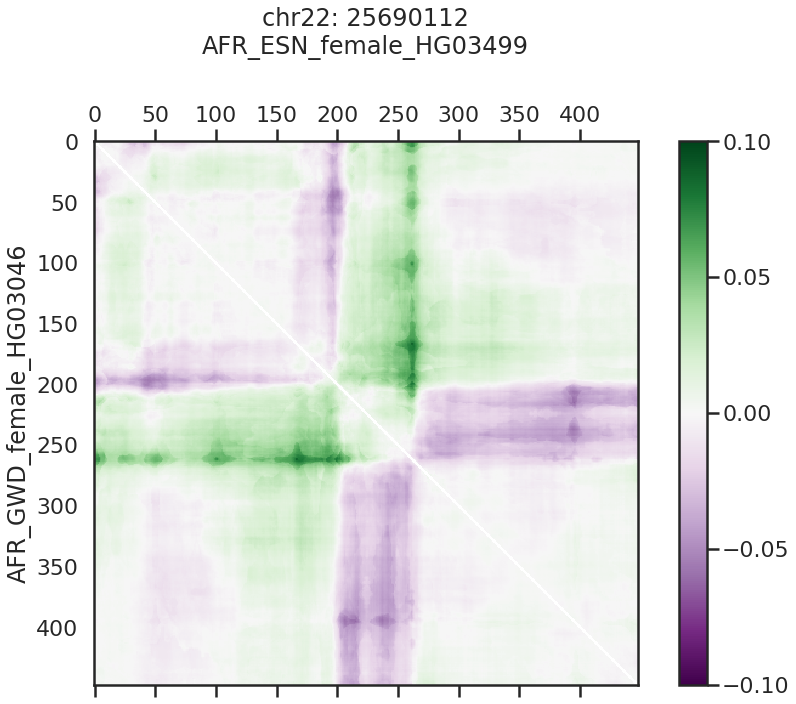

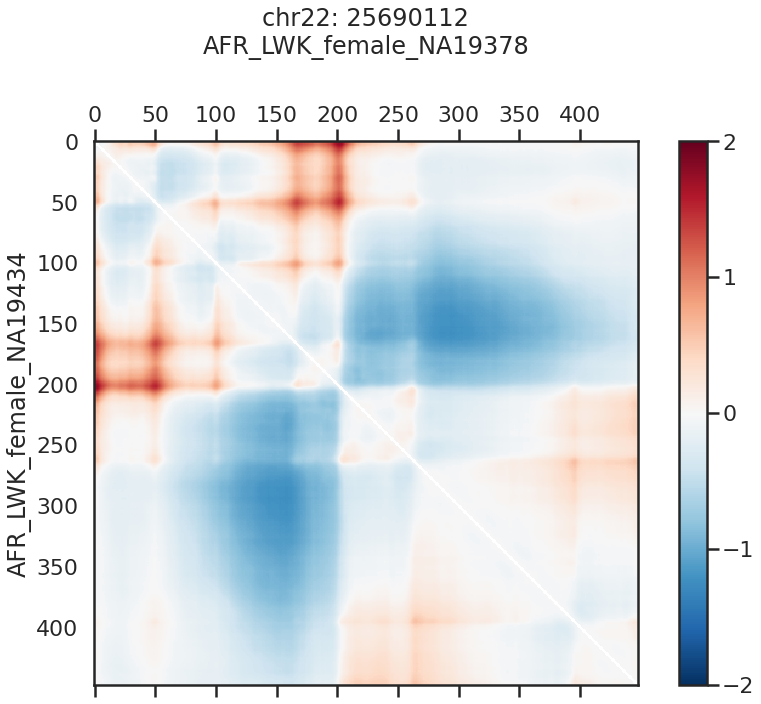

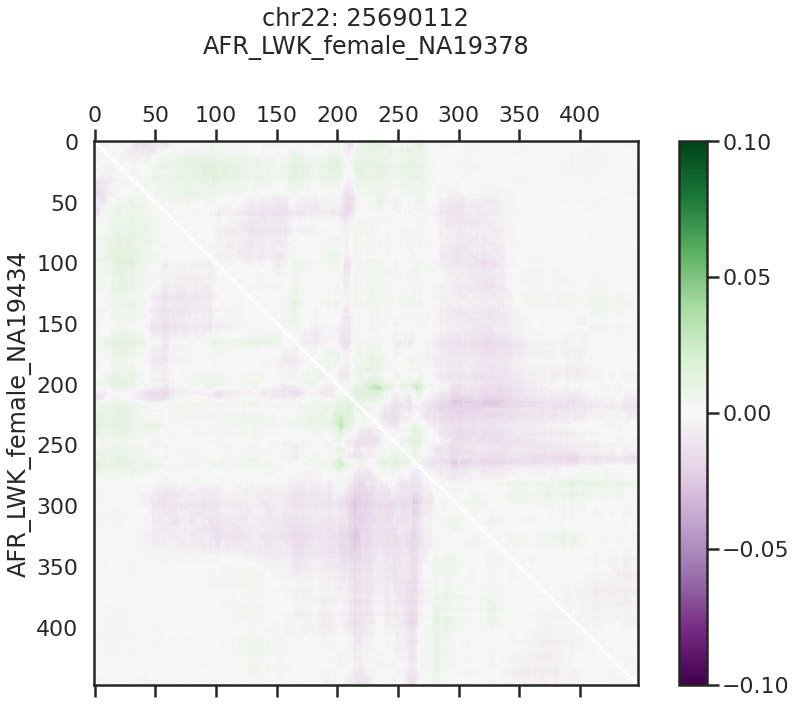

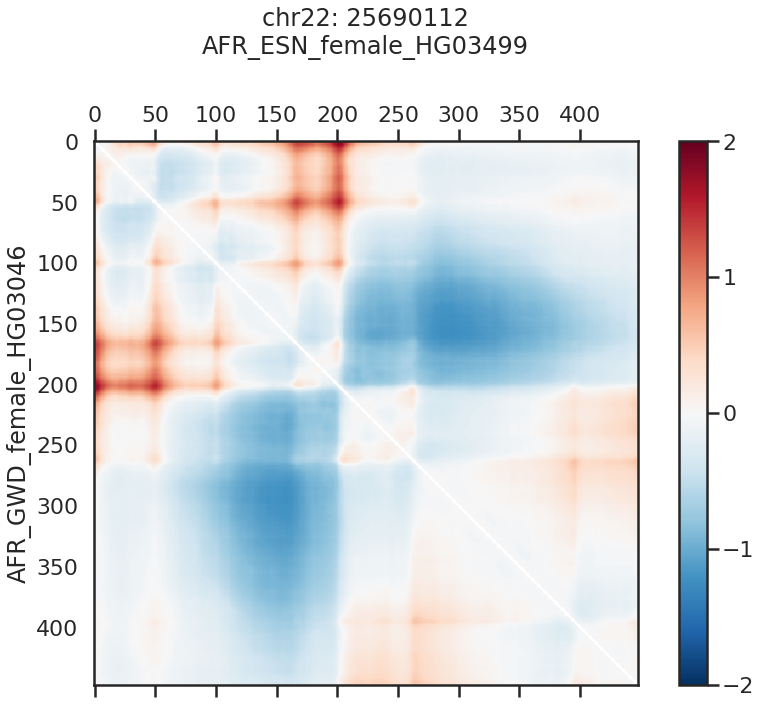

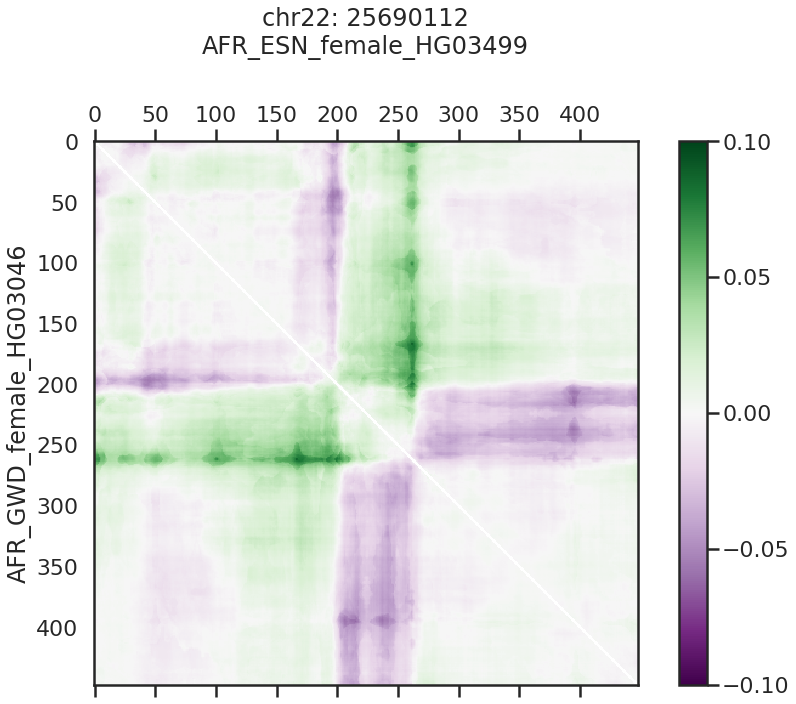

In [756]:
p = 1

min_within = sup_mses['AFR'].loc[chrm,positions[p]].sort_values().index[0]
max_within = sup_mses['AFR'].loc[chrm,positions[p]].sort_values().index[-1]

min_between = sup_mses['AFR'].loc[chrm,positions[p]].sort_values().index[0]
max_between = sup_mses['AFR'].loc[chrm,positions[p]].sort_values().index[-1]

plot_pair_contact(min_within, positions[p], chrm)
plot_pair_contact(max_within, positions[p], chrm)
plot_pair_contact(min_between, positions[p], chrm)
plot_pair_contact(max_between, positions[p], chrm)

#### Position 2 (high 3D Fst )

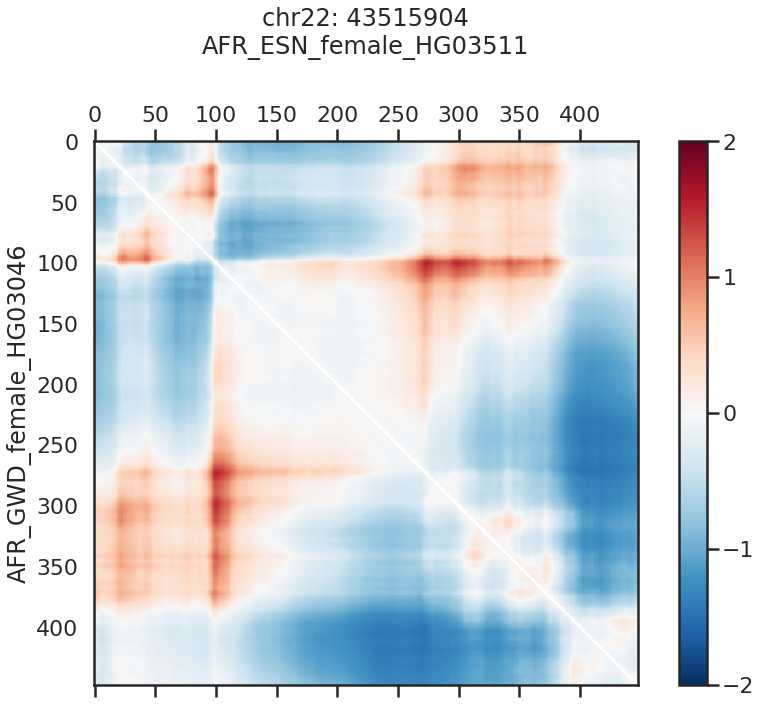

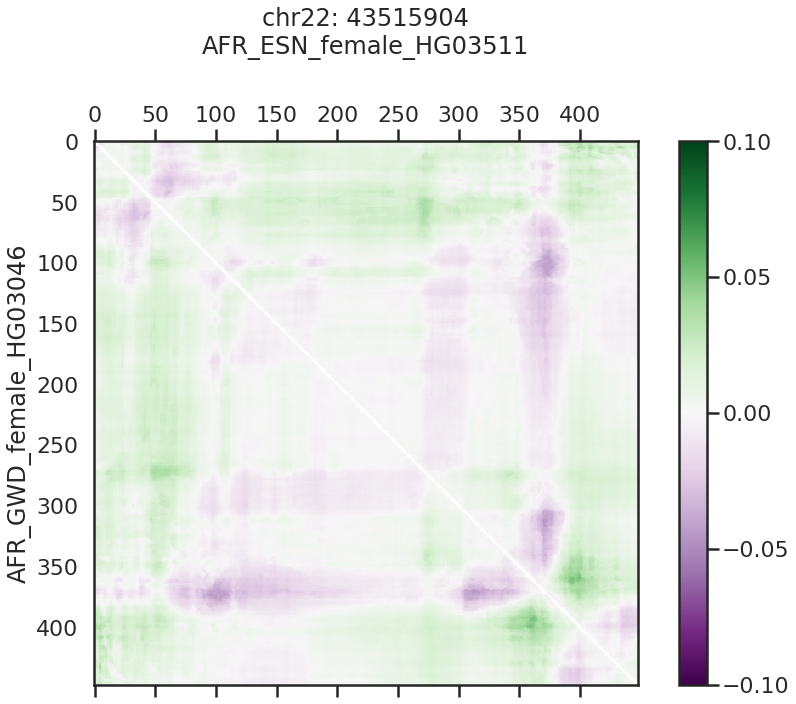

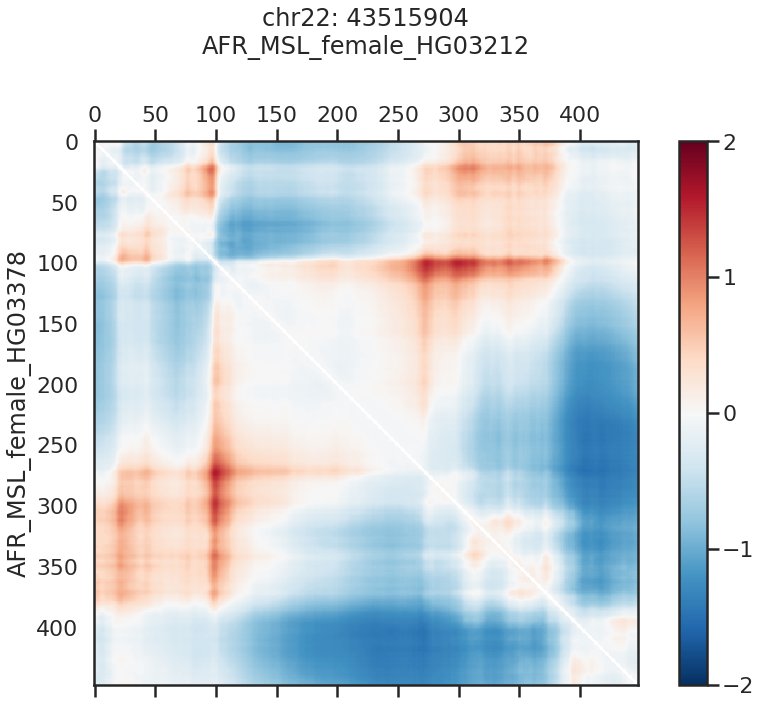

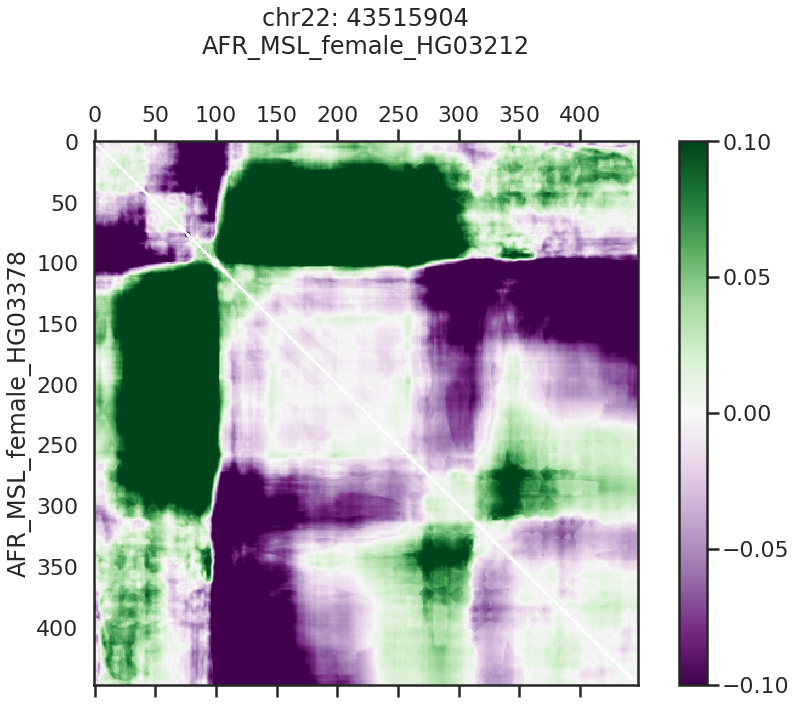

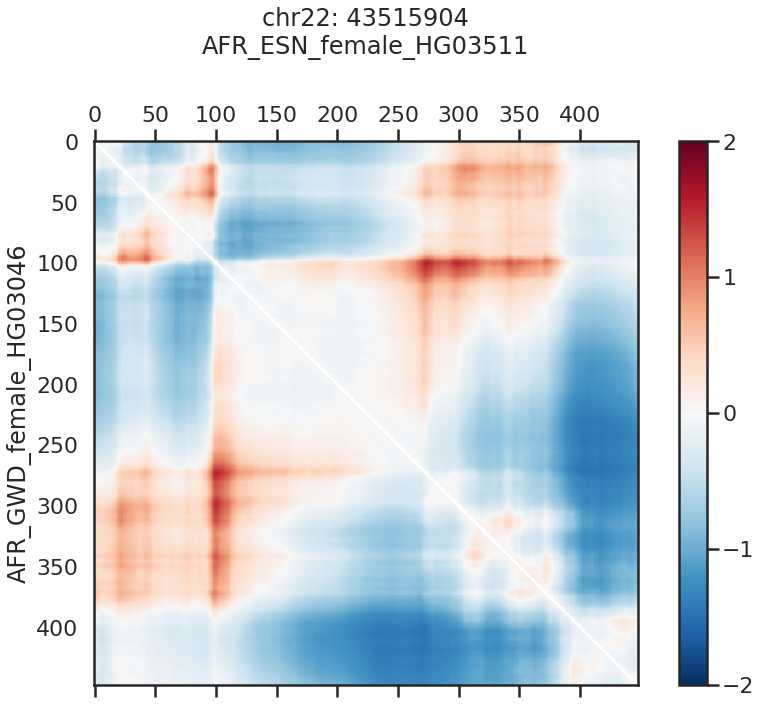

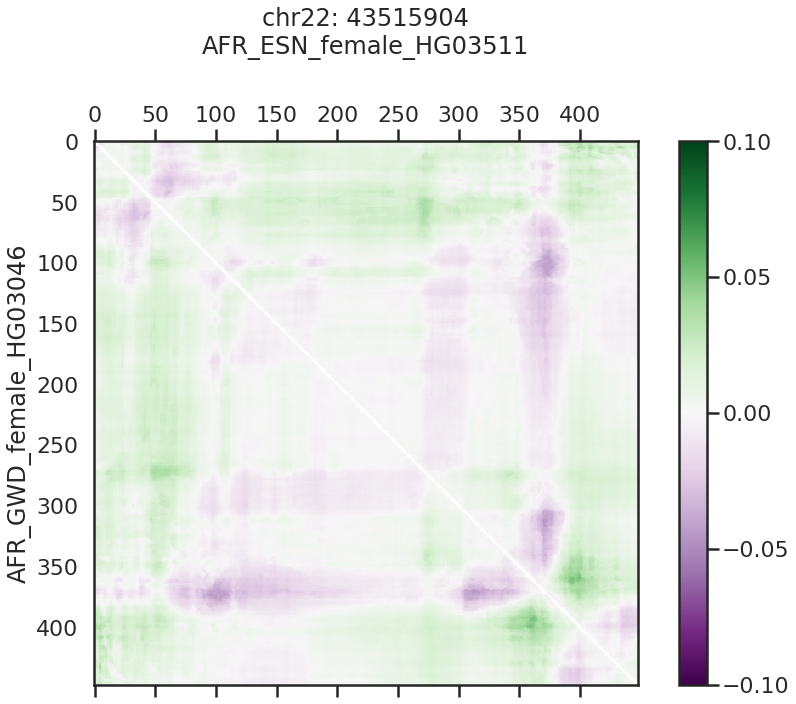

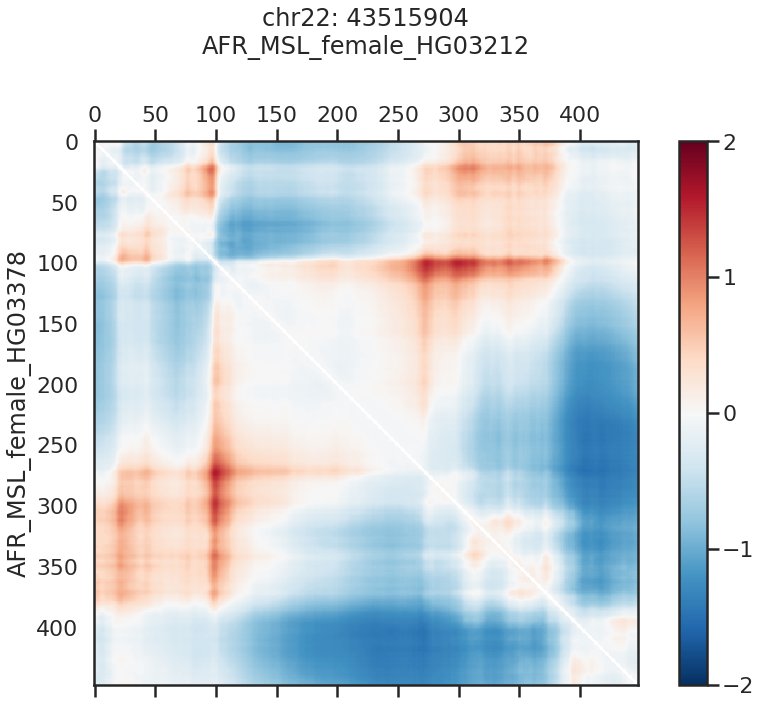

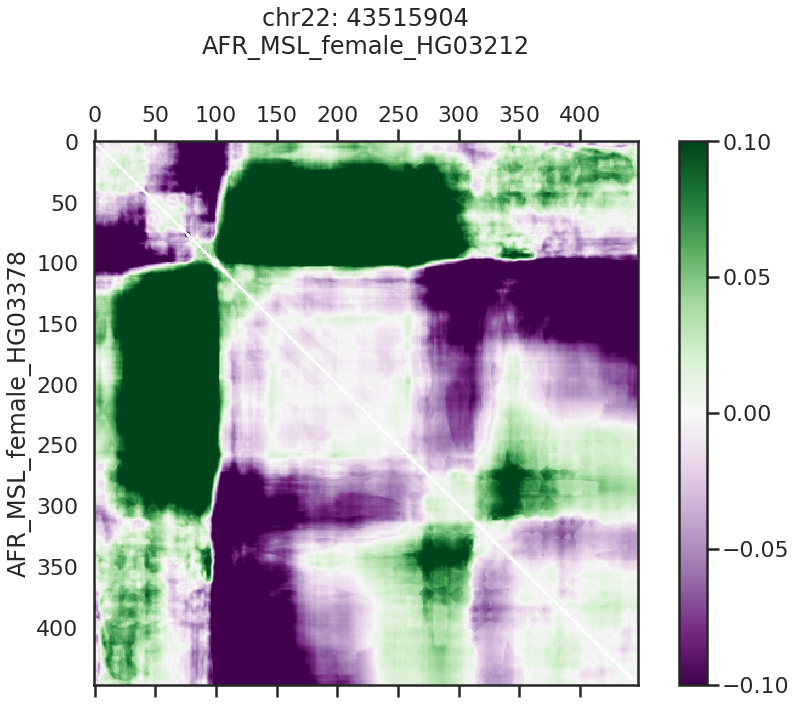

In [758]:
p = 2

min_within = sup_mses['AFR'].loc[chrm,positions[p]].sort_values().index[0]
max_within = sup_mses['AFR'].loc[chrm,positions[p]].sort_values().index[-1]

min_between = sup_mses['nonAFR'].loc[chrm,positions[p]].sort_values().index[0]
max_between = sup_mses['nonAFR'].loc[chrm,positions[p]].sort_values().index[-1]

plot_pair_contact(min_within, positions[p], chrm)
plot_pair_contact(max_within, positions[p], chrm)
plot_pair_contact(min_between, positions[p], chrm)
plot_pair_contact(max_between, positions[p], chrm)

#### Position 3 (maximum 3D Fst)

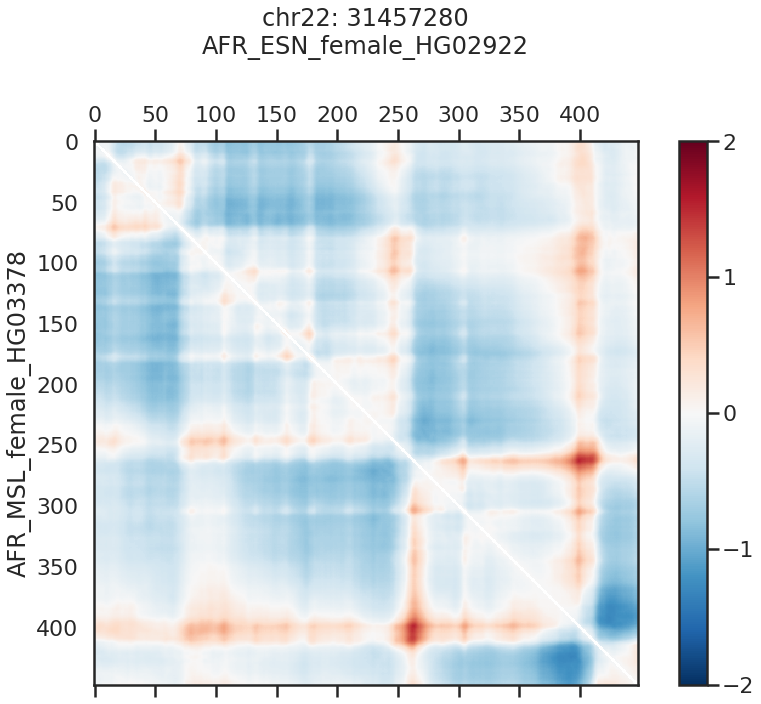

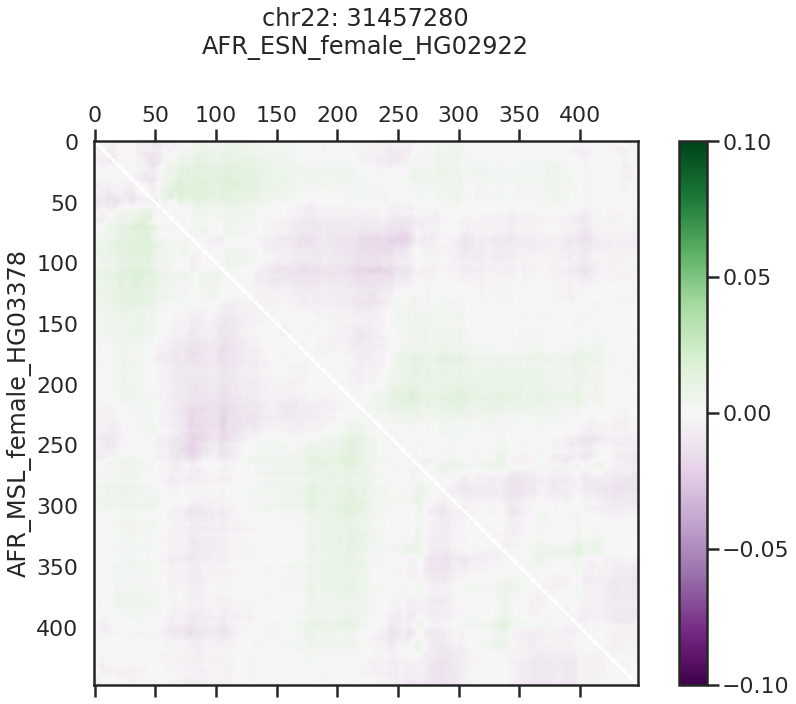

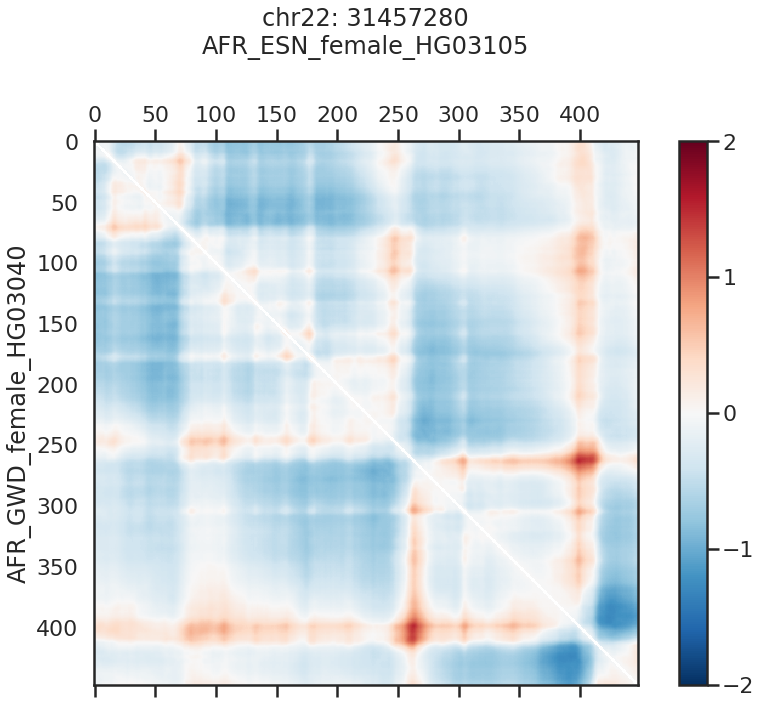

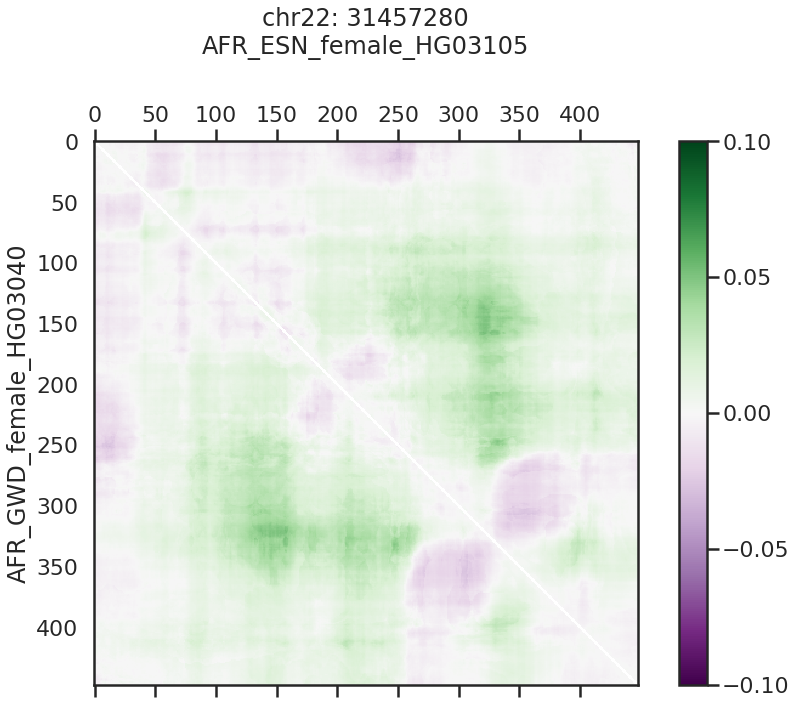

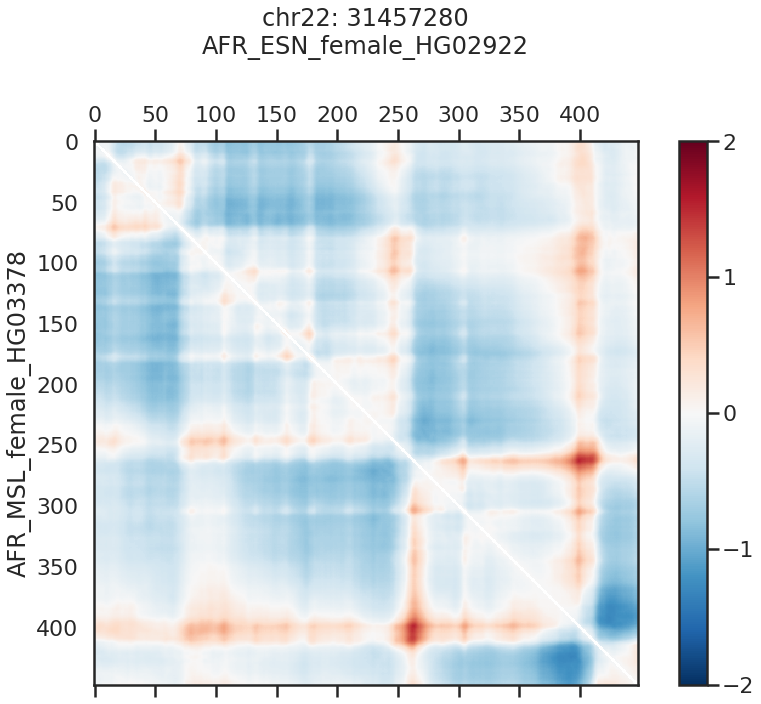

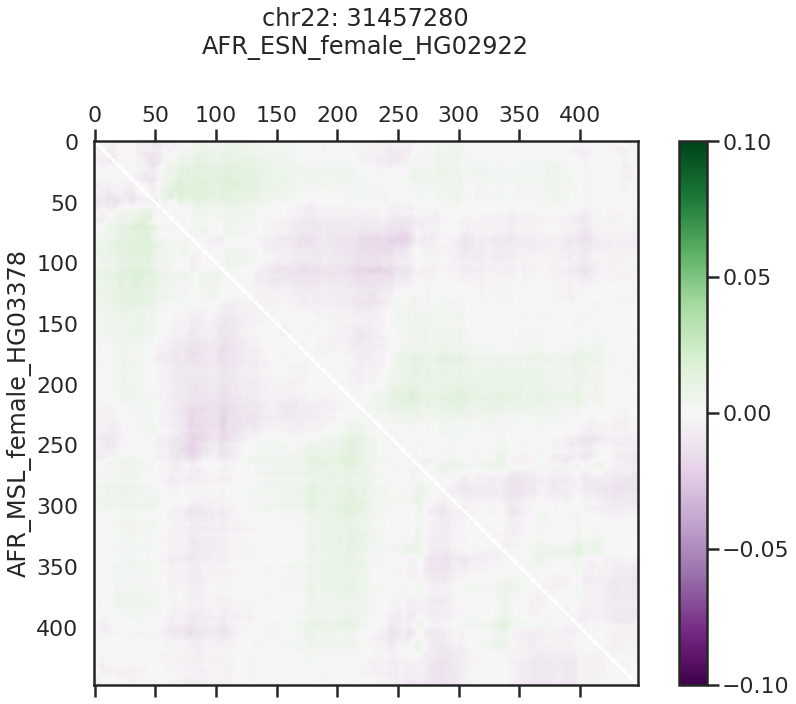

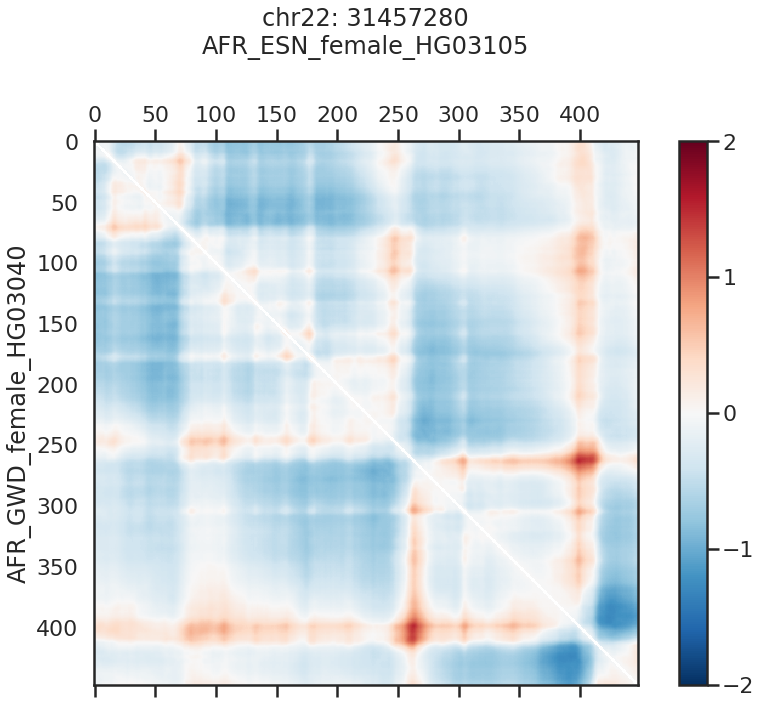

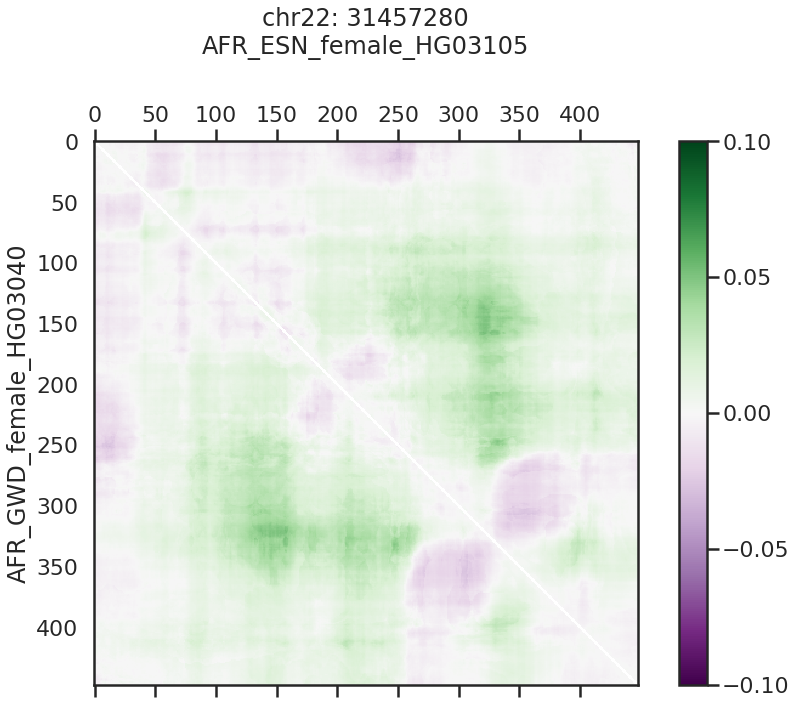

In [759]:
p = 3

min_within = sup_mses['AFR'].loc[chrm,positions[p]].sort_values().index[0]
max_within = sup_mses['AFR'].loc[chrm,positions[p]].sort_values().index[-1]

min_between = sup_mses['AFR'].loc[chrm,positions[p]].sort_values().index[0]
max_between = sup_mses['AFR'].loc[chrm,positions[p]].sort_values().index[-1]

plot_pair_contact(min_within, positions[p], chrm)
plot_pair_contact(max_within, positions[p], chrm)
plot_pair_contact(min_between, positions[p], chrm)
plot_pair_contact(max_between, positions[p], chrm)

## AFR-AFR subpopulations

### Option 1

In [463]:

def super_fill_one_sub(sup, sub_pairs):
    dicty = {}
    for pair in sup_pairs[sup]:
        sub0 = pair[0].split('_')[1]
        sub1 = pair[1].split('_')[1]
        if sub0==sub1:
            dicty = one_fill(pair, sub0, dicty)
        else:
            dicty = one_fill(pair, 'Cross', dicty)
    sub_pairs[sup] = dicty
    return sub_pairs

In [464]:
sub_pairs={}
sub_mses = {}
for sup in sup_pairs.keys():
    sub_pairs = super_fill_one_sub(sup, sub_pairs)
    sub_mses = mses_fill_subs_for_one_super(sup, sub_mses)

In [465]:
sub_mses['AFR']['Cross']

(AFR_LWK_female_NA19378, AFR_MSL_female_HG03086)  \
chr   windowStartPos                                                     
chr1  524288                                                  0.000565   
      1048576                                                 0.000760   
      1572864                                                 0.000974   
      4194304                                                 0.000705   
      4718592                                                 0.000475   
...                                                                ...   
chr22 47185920                                                0.000379   
      47710208                                                0.000033   
      48234496                                                0.000399   
      48758784                                                0.001088   
      49283072                                                0.001071   

                      (AFR_LWK_female_NA19378, AFR_MSL_female_HG03378)  \
chr   windowStartPos                                                     
chr1  524288                                                  0.000537   
      1048576                                                 0.003268   
      1572864                                                 0.001935   
      4194304                                                 0.000778   
      4718592                                                 0.000126   
...                                                                ...   
chr22 47185920                                                0.000153   
      47710208                                                0.000053   
      48234496                                                0.001103   
      48758784                                                0.002088   
      49283072                                                0.002503   

                      (AFR_LWK_female_NA19378, AFR_MSL_female_HG03437)  \
chr   windowStartPos                                                     
chr1  524288                                                  0.000853   
      1048576                                                 0.000348   
      1572864                                                 0.000798   
      4194304                                                 0.000860   
      4718592                                                 0.000351   
...                                                                ...   
chr22 47185920                                                0.000197   
      47710208                                                0.000026   
      48234496                                                0.000603   
      48758784                                                0.001350   
      49283072                                                0.001525   

                      (AFR_LWK_female_NA19378, AFR_MSL_female_HG03212)  \
chr   windowStartPos                                                     
chr1  524288                                                  0.001061   
      1048576                                                 0.001635   
      1572864                                                 0.001178   
      4194304                                                 0.000229   
      4718592                                                 0.000121   
...                                                                ...   
chr22 47185920                                                0.000370   
      47710208                                                0.000039   
      48234496                                                0.001785   
      48758784                                                0.002562   
      49283072                                                0.001702   

                      (AFR_LWK_female_NA19445, AFR_MSL_female_HG03086)  \
chr   windowStartPos                                                     
chr1  524288          

In [466]:
b = sub_mses['AFR']['Cross'].msdiff
w = sub_mses['AFR']['ESN'].msdiff
## fst = (b-w)/b
esn_fst = pd.DataFrame(fst3D(b,w, False))
esn_fst['between_msdiff'] = b
esn_fst['within_msdiff'] = w

In [467]:
sub_mses['AFR']['ESN'].columns

Index([('AFR_ESN_female_HG03105', 'AFR_ESN_female_HG03511'),
       ('AFR_ESN_female_HG03105', 'AFR_ESN_female_HG03514'),
       ('AFR_ESN_female_HG03105', 'AFR_ESN_female_HG03499'),
       ('AFR_ESN_female_HG03511', 'AFR_ESN_female_HG03514'),
       ('AFR_ESN_female_HG03499', 'AFR_ESN_female_HG03511'),
       ('AFR_ESN_female_HG03499', 'AFR_ESN_female_HG03514'),
       ('AFR_ESN_female_HG02922', 'AFR_ESN_female_HG03105'),
       ('AFR_ESN_female_HG02922', 'AFR_ESN_female_HG03511'),
       ('AFR_ESN_female_HG02922', 'AFR_ESN_female_HG03514'),
       ('AFR_ESN_female_HG02922', 'AFR_ESN_female_HG03499'),
                                                   'msdiff'],
      dtype='object')

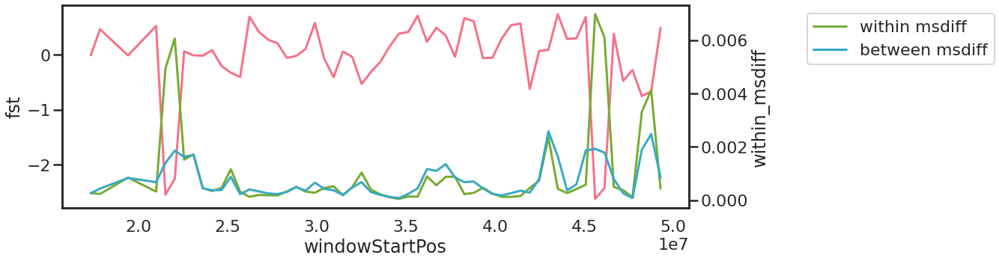

In [468]:
plt.figure(figsize=(15,5))
sns.lineplot(y = esn_fst.loc['chr22'].fst, x=esn_fst.loc['chr22'].index, color = sns.husl_palette(10)[0])
ax2 = plt.twinx()
sns.lineplot(y = esn_fst.loc['chr22'].within_msdiff, x=esn_fst.loc['chr22'].index, ax=ax2, color=sns.husl_palette(10)[3], label='within msdiff')
sns.lineplot(y = esn_fst.loc['chr22'].between_msdiff, x=esn_fst.loc['chr22'].index, ax=ax2, color=sns.husl_palette(10)[6], label='between msdiff')
ax2.legend(loc='upper right', bbox_to_anchor=(1, .5, .5, .5))
plt.show()

count    58.000000
mean     -0.059115
std       0.759466
min      -2.627881
25%      -0.184753
50%       0.064701
75%       0.408347
max       0.741509
Name: fst, dtype: float64

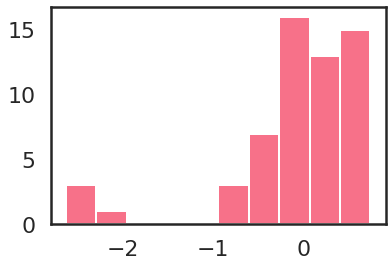

In [469]:
plt.hist(esn_fst.loc['chr22'].fst)
esn_fst.loc['chr22'].fst.describe()

### Option 2 - start here!

In [473]:
def super_fill_one_sub(sup, sub_pairs, focal):
    dicty = {}
    for pair in sup_pairs[sup]:
        sub0 = pair[0].split('_')[1]
        sub1 = pair[1].split('_')[1]
        if sub0==sub1:
            dicty = one_fill(pair, sub0, dicty)
        elif sub0 != focal and sub1 != focal:
            dicty = one_fill(pair, 'Cross', dicty)
    sub_pairs[sup] = dicty
    return sub_pairs


In [474]:
sub_pairs={}
sub_mses = {}
sub_pairs = super_fill_one_sub('AFR', sub_pairs, 'ESN')
sub_mses = mses_fill_subs_for_one_super('AFR', sub_mses)

In [475]:
b = sub_mses['AFR']['Cross'].msdiff
w = sub_mses['AFR']['ESN'].msdiff
## fst = (b-w)/b
esn_fst = pd.DataFrame(fst3D(b,w, False))
esn_fst['between_msdiff'] = b
esn_fst['within_msdiff'] = w

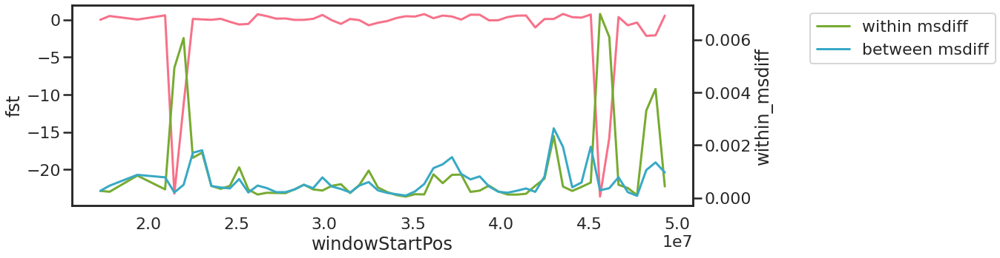

In [476]:
plt.figure(figsize=(15,5))
sns.lineplot(y = esn_fst.loc['chr22'].fst, x=esn_fst.loc['chr22'].index, color = sns.husl_palette(10)[0])
ax2 = plt.twinx()
sns.lineplot(y = esn_fst.loc['chr22'].within_msdiff, x=esn_fst.loc['chr22'].index, ax=ax2, color=sns.husl_palette(10)[3], label='within msdiff')
sns.lineplot(y = esn_fst.loc['chr22'].between_msdiff, x=esn_fst.loc['chr22'].index, ax=ax2, color=sns.husl_palette(10)[6], label='between msdiff')
ax2.legend(loc='upper right', bbox_to_anchor=(1, .5, .5, .5))
plt.show()

count    58.000000
mean     -1.220256
std       4.966424
min     -23.610618
25%      -0.247028
50%       0.109797
75%       0.464727
max       0.779387
Name: fst, dtype: float64

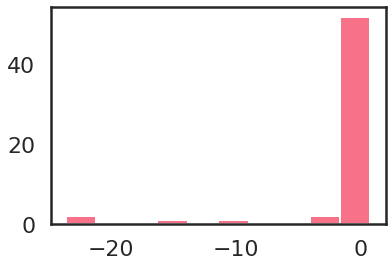

In [477]:
plt.hist(esn_fst.loc['chr22'].fst)
esn_fst.loc['chr22'].fst.describe()

### Option 3

In [479]:
def super_fill_one_sub(sup, sub_pairs, focal):
    dicty = {}
    for pair in sup_pairs[sup]:
        sub0 = pair[0].split('_')[1]
        sub1 = pair[1].split('_')[1]
        if sub0==sub1==focal:
            dicty = one_fill(pair, sub0, dicty)
        else:
            dicty = one_fill(pair, 'Cross', dicty)
    sub_pairs[sup] = dicty
    return sub_pairs

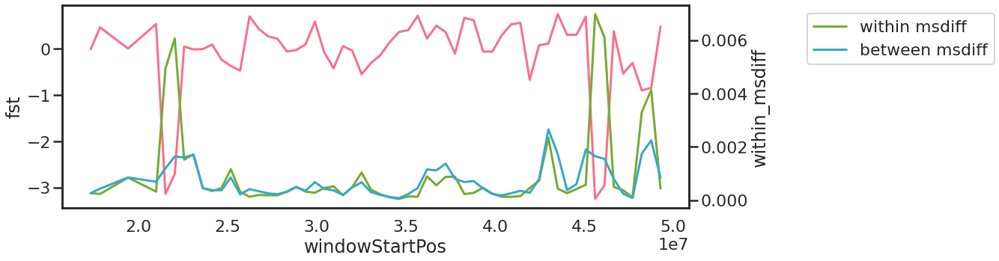

count    58.000000
mean     -0.106308
std       0.891071
min      -3.246685
25%      -0.208760
50%       0.069393
75%       0.400449
max       0.753146
Name: fst, dtype: float64

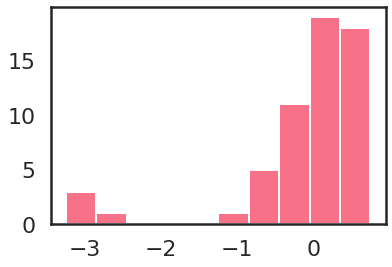

In [480]:
sub_pairs={}
sub_mses = {}
sub_pairs = super_fill_one_sub('AFR', sub_pairs, 'ESN')
sub_mses = mses_fill_subs_for_one_super('AFR', sub_mses)

b = sub_mses['AFR']['Cross'].msdiff
w = sub_mses['AFR']['ESN'].msdiff
## fst = (b-w)/b
esn_fst = pd.DataFrame(fst3D(b,w, False))
esn_fst['between_msdiff'] = b
esn_fst['within_msdiff'] = w

plt.figure(figsize=(15,5))
sns.lineplot(y = esn_fst.loc['chr22'].fst, x=esn_fst.loc['chr22'].index, color = sns.husl_palette(10)[0])
ax2 = plt.twinx()
sns.lineplot(y = esn_fst.loc['chr22'].within_msdiff, x=esn_fst.loc['chr22'].index, ax=ax2, color=sns.husl_palette(10)[3], label='within msdiff')
sns.lineplot(y = esn_fst.loc['chr22'].between_msdiff, x=esn_fst.loc['chr22'].index, ax=ax2, color=sns.husl_palette(10)[6], label='between msdiff')
ax2.legend(loc='upper right', bbox_to_anchor=(1, .5, .5, .5))
plt.show()

plt.hist(esn_fst.loc['chr22'].fst)
esn_fst.loc['chr22'].fst.describe()